In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 800)



In [2]:
def missing_values_analysis(df):
    na_columns_ = [col for col in df.columns if df[col].isnull().sum() > 0]
    n_miss = df[na_columns_].isnull().sum().sort_values(ascending=False)
    ratio_ = (df[na_columns_].isnull().sum() / df.shape[0] * 100).sort_values(ascending=False)
    missing_df = pd.concat([n_miss, np.round(ratio_, 2)], axis=1, keys=['Total Missing Values', 'Ratio'])
    missing_df = pd.DataFrame(missing_df).sort_values(by="Ratio", ascending=False)
    return missing_df


def check_df(dataframe, head=5, tail=5):
    print("*" * 70)
    print(" Shape ".center(70, "*"))
    print("*" * 70)
    print(dataframe.shape)

    print("*" * 70)
    print(" Types ".center(70, "*"))
    print("*" * 70)
    print(dataframe.dtypes)

    print("*" * 70)
    print(" Head ".center(70, "*"))
    print("*" * 70)
    print(dataframe.head(head))

    print("*" * 70)
    print(" Tail ".center(70, "*"))
    print("*" * 70)
    print(dataframe.tail(tail))

    print("*" * 70)
    print(" NA ".center(70, "*"))
    print("*" * 70)
    print(missing_values_analysis(dataframe))

    print("*" * 70)
    print(" Quantiles ".center(70, "*"))
    print("*" * 70)
    print(dataframe.describe([.01, .05, .1, .5, .9, .95, .99]).T)

    print("*" * 70)
    print(" Duplicate Rows ".center(70, "*"))
    print("*" * 70)
    print(dataframe.duplicated().sum())

    print("*" * 70)
    print(" Uniques ".center(70, "*"))
    print("*" * 70)
    print(dataframe.nunique())

In [2]:
train = pd.read_csv("./data/train.csv", encoding="latin-1")
test = pd.read_csv("./data/test.csv", encoding="latin-1")


In [4]:
app_train = train.copy()
app_test = test.copy()
app_train.drop_duplicates(inplace=True)
app_train.drop_duplicates(subset=["ID"], keep='first', inplace=True)


In [5]:
train[train.ID == 2273]


,ID,DiagnosticICD10Code,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Sex,Service,DoctorID,AnaesthetistID,ElapsedTime(second)
1221,2273,"{nan, 'M20.1', 'I87.2'}","{'B', 'C'}",Spinal Anestezi,NaN,60,FEMALE,ORTOPED? SERV?S?,32,11,6474
1871,2273,"{nan, 'M20.1', 'I87.2'}","{'B', 'C'}",Spinal Anestezi,NaN,60,FEMALE,ORTOPED? SERV?S?,32,11,6472


In [6]:
app_train[app_train.ID == 2273]


,ID,DiagnosticICD10Code,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Sex,Service,DoctorID,AnaesthetistID,ElapsedTime(second)
1221,2273,"{nan, 'M20.1', 'I87.2'}","{'B', 'C'}",Spinal Anestezi,NaN,60,FEMALE,ORTOPED? SERV?S?,32,11,6474


In [7]:
app_train_clean = app_train.copy()
app_train_clean["DiagnosticICD10Code"] = app_train_clean["DiagnosticICD10Code"].str[1:-1]
app_train_clean["DiagnosticICD10Code"] = app_train_clean["DiagnosticICD10Code"].str.replace("'","")
app_train_clean["SurgeryGroup"] = app_train_clean["SurgeryGroup"].str[1:-1]
app_train_clean["SurgeryGroup"] = app_train_clean["SurgeryGroup"].str.replace("'","")
app_train_clean.head()

,ID,DiagnosticICD10Code,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Sex,Service,DoctorID,AnaesthetistID,ElapsedTime(second)
0,1829,L05,C,Spinal Anestezi,Pilonidal kist,26,MALE,GENEL CERRAH? SERV?S?,5,13,6333
1,1104,N20.1,C,Spinal Anestezi,NaN,24,MALE,ÜROLOJ? SERV?S?,15,3,2972
2,1850,K80.8,B,Genel Anestezi,"Kolelitiazis, di?er",38,MALE,GENEL CERRAH? SERV?S?,36,14,4647
3,1059,"nan, M51.1","0, B",Genel Anestezi,Lumbar ve di?er intervertebral disk bozuklukla...,41,FEMALE,ORTOPED? SERV?S?,42,6,4871
4,608,"M51.1, nan, M48.0","0, B, C, D, A3",Genel Anestezi,Lumbar ve di?er intervertebral disk bozuklukla...,49,FEMALE,ORTOPED? SERV?S?,42,9,9046


In [8]:
app_test_clean = app_test.copy()
app_test_clean["DiagnosticICD10Code"] = app_test_clean["DiagnosticICD10Code"].str[1:-1]
app_test_clean["DiagnosticICD10Code"] = app_test_clean["DiagnosticICD10Code"].str.replace("'","")
app_test_clean["SurgeryGroup"] = app_test_clean["SurgeryGroup"].str[1:-1]
app_test_clean["SurgeryGroup"] = app_test_clean["SurgeryGroup"].str.replace("'","")
app_test_clean.head()

,ID,DiagnosticICD10Code,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Sex,Service,DoctorID,AnaesthetistID
0,1669,H26.9,C,Sedo Analjezi,NaN,70,FEMALE,GÖZ HASTALIKLARI SERV?S?,49,13
1,2091,L05.9,C,Spinal Anestezi,Pilonidal kist,41,MALE,GENEL CERRAH? SERV?S?,36,6
2,585,M50.1,A3,Genel Anestezi,"Servikal disk bozukluklar?, radikülopati ile",59,FEMALE,ORTOPED? SERV?S?,42,14
3,1455,S42.2,B,Genel Anestezi,Humerus üst uç k?r???,54,FEMALE,ORTOPED? SERV?S?,23,14
4,1801,I82,"0, E",Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,50,MALE,KVC SERV?S?,46,13


In [9]:
app_train_clean['Any_NaN_Diagnos'] = app_train_clean['DiagnosticICD10Code'].apply(lambda x: 1 if 'nan,' in str(x) else 0)
app_test_clean['Any_NaN_Diagnos'] = app_test_clean['DiagnosticICD10Code'].apply(lambda x: 1 if 'nan,' in str(x) else 0)

In [10]:
def clean_diagnosis(diagnosis):
    if isinstance(diagnosis, str):
        return set(diagnosis.replace(', nan', '').replace(' nan,', '').replace('nan,', '').replace(' ', '').split(','))
    else:
        return diagnosis

app_train_clean['Diagnos_Clean'] = app_train_clean['DiagnosticICD10Code'].apply(clean_diagnosis)
app_test_clean['Diagnos_Clean'] = app_test_clean['DiagnosticICD10Code'].apply(clean_diagnosis)

In [11]:
map_dict = {'0': 1, 'E': 1, 'D': 2, 'C': 3, 'B': 4, 'A3': 5, 'A2': 6, 'A1': 7}
mapper = lambda x: [map_dict[val.strip()] for val in x.split(',')]
app_train_clean["SurgeryGroup_Encode"] = app_train_clean["SurgeryGroup"].apply(mapper)
app_test_clean["SurgeryGroup_Encode"] = app_test_clean["SurgeryGroup"].apply(mapper)

In [12]:
app_train_clean["SurgeryGroup_Sum"] = app_train_clean["SurgeryGroup_Encode"].apply(lambda x: np.sum(x))
app_train_clean["SurgeryGroup_Count"] = app_train_clean["SurgeryGroup_Encode"].apply(lambda x: len(x))
app_train_clean["SurgeryGroup_Avg"] = app_train_clean["SurgeryGroup_Encode"].apply(lambda x: np.mean(x))
app_train_clean["SurgeryGroup_Std"] = app_train_clean["SurgeryGroup_Encode"].apply(lambda x: np.std(x))
app_train_clean["SurgeryGroup_Max"] = app_train_clean["SurgeryGroup_Encode"].apply(lambda x: np.max(x))
app_train_clean["SurgeryGroup_Min"] = app_train_clean["SurgeryGroup_Encode"].apply(lambda x: np.min(x))

In [13]:
app_test_clean["SurgeryGroup_Sum"] = app_test_clean["SurgeryGroup_Encode"].apply(lambda x: np.sum(x))
app_test_clean["SurgeryGroup_Count"] = app_test_clean["SurgeryGroup_Encode"].apply(lambda x: len(x))
app_test_clean["SurgeryGroup_Avg"] = app_test_clean["SurgeryGroup_Encode"].apply(lambda x: np.mean(x))
app_test_clean["SurgeryGroup_Std"] = app_test_clean["SurgeryGroup_Encode"].apply(lambda x: np.std(x))
app_test_clean["SurgeryGroup_Max"] = app_test_clean["SurgeryGroup_Encode"].apply(lambda x: np.max(x))
app_test_clean["SurgeryGroup_Min"] = app_test_clean["SurgeryGroup_Encode"].apply(lambda x: np.min(x))

In [14]:
app_train_clean[app_train_clean["ID"]==3228]

,ID,DiagnosticICD10Code,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Sex,Service,DoctorID,AnaesthetistID,ElapsedTime(second),Any_NaN_Diagnos,Diagnos_Clean,SurgeryGroup_Encode,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min
92,3228,"K21.9, J15.9, N30.0, N21.1, N30.9, L30.3, N40,...",B,Spinal Anestezi,Üretra ta??,68,MALE,ÜROLOJ? SERV?S?,15,2,4581,0,"{J15.9, N30.9, L30.3, N21.1, N30.0, N40, M19.9...",[4],4,1,4.0,0.0,4,4


In [15]:
app_train_clean[app_train_clean["ID"]==245]

,ID,DiagnosticICD10Code,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Sex,Service,DoctorID,AnaesthetistID,ElapsedTime(second),Any_NaN_Diagnos,Diagnos_Clean,SurgeryGroup_Encode,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min
2014,245,"K21.9, J15.9, R31, N30.0, M19.9, I10",C,Spinal Anestezi,NaN,71,MALE,ÜROLOJ? SERV?S?,15,2,5415,0,"{J15.9, I10, R31, N30.0, M19.9, K21.9}",[3],3,1,3.0,0.0,3,3


In [16]:
app_train_clean.loc[92, "Diagnos_Clean"] = np.nan
app_train_clean.loc[2014, "Diagnos_Clean"] = np.nan

In [17]:
app_train_clean["Diagnos_Clean"] = app_train_clean["Diagnos_Clean"].fillna('')
app_train_clean['Diagnos_Clean'] = app_train_clean['Diagnos_Clean'].apply(lambda x: sorted(x, key=lambda d: d[0]))

In [18]:
app_test_clean.loc[787, "Diagnos_Clean"] = np.nan
app_test_clean.loc[285, "Diagnos_Clean"] = np.nan

In [19]:
app_test_clean["Diagnos_Clean"] = app_test_clean["Diagnos_Clean"].fillna('')
app_test_clean['Diagnos_Clean'] = app_test_clean['Diagnos_Clean'].apply(lambda x: sorted(x, key=lambda d: d[0]))

In [20]:
from tqdm import tqdm
from tqdm.notebook import tqdm
tqdm.pandas()
import itertools


# function to generate all possible combinations with first characters for a set of diagnoses
def generate_combinations_first_char(diagnoses):
    diagnoses = [d for d in diagnoses if pd.notna(d)]
    first_chars = [diag[0] for diag in diagnoses]
    combinations = []
    for i in range(1, len(diagnoses)+1):
        for combo in itertools.combinations(first_chars, i):
            combinations.append('-'.join(combo))
    return combinations

# function to generate all possible combinations with all characters for a set of diagnoses
def generate_combinations_all_char(diagnoses):
    diagnoses = [d for d in diagnoses if pd.notna(d)]
    first_chars = [diag for diag in diagnoses]
    combinations = []
    for i in range(1, len(diagnoses)+1):
        for combo in itertools.combinations(first_chars, i):
            combinations.append('-'.join(combo))
    return combinations

# generate all combinations for each patient and add them as new columns to the DataFrame
for i, row in tqdm(app_train_clean.iterrows(), total=len(app_train_clean)):
    combos = generate_combinations_first_char(row['Diagnos_Clean'])
    for j, combo in enumerate(combos):
        col_name = f'combination_first_{j+1}'
        app_train_clean.at[i, col_name] = combo

for i, row in tqdm(app_train_clean.iterrows(), total=len(app_train_clean)):
    combos = generate_combinations_all_char(row['Diagnos_Clean'])
    for j, combo in enumerate(combos):
        col_name = f'combination_all_{j+1}'
        app_train_clean.at[i, col_name] = combo

app_train_clean.head()

  0%|          | 0/2714 [00:00<?, ?it/s]

  0%|          | 0/2714 [00:00<?, ?it/s]

,ID,DiagnosticICD10Code,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Sex,Service,DoctorID,AnaesthetistID,ElapsedTime(second),Any_NaN_Diagnos,Diagnos_Clean,SurgeryGroup_Encode,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,combination_first_1,combination_first_2,combination_first_3,combination_first_4,combination_first_5,combination_first_6,combination_first_7,combination_first_8,combination_first_9,combination_first_10,combination_first_11,combination_first_12,combination_first_13,combination_first_14,combination_first_15,combination_first_16,combination_first_17,combination_first_18,combination_first_19,combination_first_20,combination_first_21,combination_first_22,combination_first_23,combination_first_24,combination_first_25,combination_first_26,combination_first_27,combination_first_28,combination_first_29,combination_first_30,combination_first_31,combination_all_1,combination_all_2,combination_all_3,combination_all_4,combination_all_5,combination_all_6,combination_all_7,combination_all_8,combination_all_9,combination_all_10,combination_all_11,combination_all_12,combination_all_13,combination_all_14,combination_all_15,combination_all_16,combination_all_17,combination_all_18,combination_all_19,combination_all_20,combination_all_21,combination_all_22,combination_all_23,combination_all_24,combination_all_25,combination_all_26,combination_all_27,combination_all_28,combination_all_29,combination_all_30,combination_all_31
0,1829,L05,C,Spinal Anestezi,Pilonidal kist,26,MALE,GENEL CERRAH? SERV?S?,5,13,6333,0,[L05],[3],3,1,3.0,0.000000,3,3,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,L05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1104,N20.1,C,Spinal Anestezi,NaN,24,MALE,ÜROLOJ? SERV?S?,15,3,2972,0,[N20.1],[3],3,1,3.0,0.000000,3,3,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N20.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1850,K80.8,B,Genel Anestezi,"Kolelitiazis, di?er",38,MALE,GENEL CERRAH? SERV?S?,36,14,4647,0,[K80.8],[4],4,1,4.0,0.000000,4,4,K,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,K80.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1059,"nan, M51.1","0, B",Genel Anestezi,Lumbar ve di?er intervertebral disk bozuklukla...,41,FEMALE,ORTOPED? SERV?S?,42,6,4871,1,[M51.1],"[1, 4]",5,2,2.5,1.500000,4,1,M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,M51.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,608,"M51.1, nan, M48.0","0, B, C, D, A3",Genel Anestezi,Lumbar ve di?er intervertebral disk bozuklukla...,49,FEMALE,ORTOPED? SERV?S?,42,9,9046,1,"[M48.0, M51.1]","[1, 4, 3, 2, 5]",15,5,3.0,1.414214,5,1,M,M,M-M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,M48.0,M51.1,M48.0-M51.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
for i, row in tqdm(app_test_clean.iterrows(), total=len(app_test_clean)):
    combos = generate_combinations_first_char(row['Diagnos_Clean'])
    for j, combo in enumerate(combos):
        col_name = f'combination_first_{j+1}'
        app_test_clean.at[i, col_name] = combo

for i, row in tqdm(app_test_clean.iterrows(), total=len(app_test_clean)):
    combos = generate_combinations_all_char(row['Diagnos_Clean'])
    for j, combo in enumerate(combos):
        col_name = f'combination_all_{j+1}'
        app_test_clean.at[i, col_name] = combo

app_test_clean.head()

  0%|          | 0/1211 [00:00<?, ?it/s]

  0%|          | 0/1211 [00:00<?, ?it/s]

,ID,DiagnosticICD10Code,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Sex,Service,DoctorID,AnaesthetistID,Any_NaN_Diagnos,Diagnos_Clean,SurgeryGroup_Encode,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,combination_first_1,combination_first_2,combination_first_3,combination_first_4,combination_first_5,combination_first_6,combination_first_7,combination_first_8,combination_first_9,combination_first_10,combination_first_11,combination_first_12,combination_first_13,combination_first_14,combination_first_15,combination_first_16,combination_first_17,combination_first_18,combination_first_19,combination_first_20,combination_first_21,combination_first_22,combination_first_23,combination_first_24,combination_first_25,combination_first_26,combination_first_27,combination_first_28,combination_first_29,combination_first_30,combination_first_31,combination_all_1,combination_all_2,combination_all_3,combination_all_4,combination_all_5,combination_all_6,combination_all_7,combination_all_8,combination_all_9,combination_all_10,combination_all_11,combination_all_12,combination_all_13,combination_all_14,combination_all_15,combination_all_16,combination_all_17,combination_all_18,combination_all_19,combination_all_20,combination_all_21,combination_all_22,combination_all_23,combination_all_24,combination_all_25,combination_all_26,combination_all_27,combination_all_28,combination_all_29,combination_all_30,combination_all_31
0,1669,H26.9,C,Sedo Analjezi,NaN,70,FEMALE,GÖZ HASTALIKLARI SERV?S?,49,13,0,[H26.9],[3],3,1,3.0,0.0,3,3,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,H26.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2091,L05.9,C,Spinal Anestezi,Pilonidal kist,41,MALE,GENEL CERRAH? SERV?S?,36,6,0,[L05.9],[3],3,1,3.0,0.0,3,3,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,L05.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,585,M50.1,A3,Genel Anestezi,"Servikal disk bozukluklar?, radikülopati ile",59,FEMALE,ORTOPED? SERV?S?,42,14,0,[M50.1],[5],5,1,5.0,0.0,5,5,M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,M50.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1455,S42.2,B,Genel Anestezi,Humerus üst uç k?r???,54,FEMALE,ORTOPED? SERV?S?,23,14,0,[S42.2],[4],4,1,4.0,0.0,4,4,S,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,S42.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1801,I82,"0, E",Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,50,MALE,KVC SERV?S?,46,13,0,[I82],"[1, 1]",2,2,1.0,0.0,1,1,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I82,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
app_train_encode = app_train_clean.copy()
app_test_encode = app_test_clean.copy()


In [23]:
app_train_encode['Age_Range'] = pd.cut(app_train_encode['Age'], bins=[0, 18, 45, 65, 102], labels=['child', 'young', 'mid', 'old'])
app_test_encode['Age_Range'] = pd.cut(app_test_encode['Age'], bins=[0, 18, 45, 65, 102], labels=['child', 'young', 'mid', 'old'])


In [24]:
app_train_encode.head()

,ID,DiagnosticICD10Code,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Sex,Service,DoctorID,AnaesthetistID,ElapsedTime(second),Any_NaN_Diagnos,Diagnos_Clean,SurgeryGroup_Encode,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,combination_first_1,combination_first_2,combination_first_3,combination_first_4,combination_first_5,combination_first_6,combination_first_7,combination_first_8,combination_first_9,combination_first_10,combination_first_11,combination_first_12,combination_first_13,combination_first_14,combination_first_15,combination_first_16,combination_first_17,combination_first_18,combination_first_19,combination_first_20,combination_first_21,combination_first_22,combination_first_23,combination_first_24,combination_first_25,combination_first_26,combination_first_27,combination_first_28,combination_first_29,combination_first_30,combination_first_31,combination_all_1,combination_all_2,combination_all_3,combination_all_4,combination_all_5,combination_all_6,combination_all_7,combination_all_8,combination_all_9,combination_all_10,combination_all_11,combination_all_12,combination_all_13,combination_all_14,combination_all_15,combination_all_16,combination_all_17,combination_all_18,combination_all_19,combination_all_20,combination_all_21,combination_all_22,combination_all_23,combination_all_24,combination_all_25,combination_all_26,combination_all_27,combination_all_28,combination_all_29,combination_all_30,combination_all_31,Age_Range
0,1829,L05,C,Spinal Anestezi,Pilonidal kist,26,MALE,GENEL CERRAH? SERV?S?,5,13,6333,0,[L05],[3],3,1,3.0,0.000000,3,3,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,L05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,young
1,1104,N20.1,C,Spinal Anestezi,NaN,24,MALE,ÜROLOJ? SERV?S?,15,3,2972,0,[N20.1],[3],3,1,3.0,0.000000,3,3,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N20.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,young
2,1850,K80.8,B,Genel Anestezi,"Kolelitiazis, di?er",38,MALE,GENEL CERRAH? SERV?S?,36,14,4647,0,[K80.8],[4],4,1,4.0,0.000000,4,4,K,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,K80.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,young
3,1059,"nan, M51.1","0, B",Genel Anestezi,Lumbar ve di?er intervertebral disk bozuklukla...,41,FEMALE,ORTOPED? SERV?S?,42,6,4871,1,[M51.1],"[1, 4]",5,2,2.5,1.500000,4,1,M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,M51.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,young
4,608,"M51.1, nan, M48.0","0, B, C, D, A3",Genel Anestezi,Lumbar ve di?er intervertebral disk bozuklukla...,49,FEMALE,ORTOPED? SERV?S?,42,9,9046,1,"[M48.0, M51.1]","[1, 4, 3, 2, 5]",15,5,3.0,1.414214,5,1,M,M,M-M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,M48.0,M51.1,M48.0-M51.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mid


In [25]:
app_test_encode.head()


,ID,DiagnosticICD10Code,SurgeryGroup,AnesthesiaType,SurgeryName,Age,Sex,Service,DoctorID,AnaesthetistID,Any_NaN_Diagnos,Diagnos_Clean,SurgeryGroup_Encode,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,combination_first_1,combination_first_2,combination_first_3,combination_first_4,combination_first_5,combination_first_6,combination_first_7,combination_first_8,combination_first_9,combination_first_10,combination_first_11,combination_first_12,combination_first_13,combination_first_14,combination_first_15,combination_first_16,combination_first_17,combination_first_18,combination_first_19,combination_first_20,combination_first_21,combination_first_22,combination_first_23,combination_first_24,combination_first_25,combination_first_26,combination_first_27,combination_first_28,combination_first_29,combination_first_30,combination_first_31,combination_all_1,combination_all_2,combination_all_3,combination_all_4,combination_all_5,combination_all_6,combination_all_7,combination_all_8,combination_all_9,combination_all_10,combination_all_11,combination_all_12,combination_all_13,combination_all_14,combination_all_15,combination_all_16,combination_all_17,combination_all_18,combination_all_19,combination_all_20,combination_all_21,combination_all_22,combination_all_23,combination_all_24,combination_all_25,combination_all_26,combination_all_27,combination_all_28,combination_all_29,combination_all_30,combination_all_31,Age_Range
0,1669,H26.9,C,Sedo Analjezi,NaN,70,FEMALE,GÖZ HASTALIKLARI SERV?S?,49,13,0,[H26.9],[3],3,1,3.0,0.0,3,3,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,H26.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,old
1,2091,L05.9,C,Spinal Anestezi,Pilonidal kist,41,MALE,GENEL CERRAH? SERV?S?,36,6,0,[L05.9],[3],3,1,3.0,0.0,3,3,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,L05.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,young
2,585,M50.1,A3,Genel Anestezi,"Servikal disk bozukluklar?, radikülopati ile",59,FEMALE,ORTOPED? SERV?S?,42,14,0,[M50.1],[5],5,1,5.0,0.0,5,5,M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,M50.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mid
3,1455,S42.2,B,Genel Anestezi,Humerus üst uç k?r???,54,FEMALE,ORTOPED? SERV?S?,23,14,0,[S42.2],[4],4,1,4.0,0.0,4,4,S,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,S42.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mid
4,1801,I82,"0, E",Sedo Analjezi,Ülser veya enflamasyon olmadan alt ekstremiten...,50,MALE,KVC SERV?S?,46,13,0,[I82],"[1, 1]",2,2,1.0,0.0,1,1,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I82,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mid


In [26]:
train_ohe_cols = list(app_train_encode.columns[3:4]) + list(app_train_encode.columns[6:10]) + list(app_train_encode.columns[20:])
test_ohe_cols = list(app_test_encode.columns[3:4]) + list(app_test_encode.columns[6:10]) + list(app_test_encode.columns[19:])


In [27]:
set(train_ohe_cols) - set(test_ohe_cols)

set()

In [28]:
app_train_encode = pd.get_dummies(app_train_encode, columns=train_ohe_cols)
app_test_encode = pd.get_dummies(app_test_encode, columns=test_ohe_cols)
app_train_encode.drop(columns=["DiagnosticICD10Code", "SurgeryGroup", "Diagnos_Clean", "SurgeryGroup_Encode", "Sex_FEMALE", "ID"], inplace = True)
app_test_encode.drop(columns=["DiagnosticICD10Code", "SurgeryGroup", "Diagnos_Clean", "SurgeryGroup_Encode", "Sex_FEMALE", "ID"], inplace = True)



In [29]:
app_train_encode.head()

,SurgeryName,Age,ElapsedTime(second),Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Periferik Bloklar,AnesthesiaType_Periferik Bloklar ve Genel Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Seçilmemi?,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_1,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_7,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_12,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_44,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_O,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_D-N,combination_first_3_G-K,combination_first_3_G-L,combination_first_3_G-M,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-K,combination_first_3_H-L,combination_first_3_H-Z,combination_first_3_I,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_J-R,combination_first_3_J-Z,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S,combination_first_3_S-S,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_H-J,combination_first_4_I,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combina

In [30]:
app_train_encode["SurgeryName"] = app_train_encode["SurgeryName"].str.strip()

In [31]:
app_test_encode["SurgeryName"] = app_test_encode["SurgeryName"].str.strip()


In [32]:
app_train_encode.shape

(2714, 1752)

In [33]:
app_test_encode.shape

(1211, 1348)

In [34]:
target = app_train_encode["ElapsedTime(second)"]
app_train_encode, app_test_encode = app_train_encode.align(app_test_encode, join = 'inner', axis = 1)

In [35]:
app_train_encode["ElapsedTime(second)"] = target


In [36]:
app_train_encode.shape

(2714, 1347)

In [37]:
app_test_encode.shape

(1211, 1346)

In [38]:
app_train_encode.to_csv("academy_encoding_train.csv", index=False)
app_test_encode.to_csv("academy_encoding_test.csv", index=False)

In [2]:
train = pd.read_csv("./data/train.csv", encoding="latin-1")
test = pd.read_csv("./data/test.csv", encoding="latin-1")

In [3]:
app_train_encode = pd.read_csv("academy_encoding_train.csv")
app_test_encode = pd.read_csv("academy_encoding_test.csv")

In [4]:
app_train_encode.shape

(2714, 1347)

In [5]:
app_test_encode.shape

(1211, 1346)

In [6]:
def encode_test(surgery_train):
    from sklearn.model_selection import KFold
    import xgboost as xgb
    from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
    import re


    regex = re.compile(r"\[|\]|<", re.IGNORECASE)
    y = surgery_train["ElapsedTime(second)"]
    X = surgery_train.drop(columns=["ElapsedTime(second)"])
    X.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in X.columns.values]

    mse_errs = []
    rmse_errs = []
    mae_errs = []
    r2_errs = []

    models = []

    kf = KFold(n_splits=10, shuffle=True, random_state= 42)

    for split_train, split_val in list(kf.split(X)):
        
        split_train = X.index[split_train]
        split_val = X.index[split_val]
        
        X_train, y_train = X.loc[split_train], y.loc[split_train]
        X_val, y_val = X.loc[split_val], y.loc[split_val]
        print("Train shape:", X_train.shape, "|", "Val Shape:", X_val.shape)

        model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)
        

        model.fit(X_train, y_train, eval_set = [(X_val, y_val), (X_train, y_train)], eval_metric='rmse')
        
        preds = model.predict(X_val)
        
        rmse_err = mean_squared_error(y_val, preds, squared=False)
        print("Fold RMSE: ", rmse_err)
        rmse_errs.append(rmse_err)

        mse_err = mean_squared_error(y_val, preds)
        print("Fold MSE: ", mse_err)
        mse_errs.append(mse_err)

        mae_err = mean_absolute_error(y_val, preds)
        print("Fold MAE: ", mae_err)
        mae_errs.append(mae_err)

        r2_err = r2_score(y_val, preds)
        print("Fold R2: ", r2_err)
        r2_errs.append(r2_err)

        models.append(model)
        
        print("\n", "*"*70, "\n")

    import plotly.express as px
    importance = [model.feature_importances_ for model in models]

    f_importance = pd.concat([pd.Series(X.columns.to_list(),name='Feature'),
                            pd.Series(np.mean(importance,axis=0),name="Importance")],
                            axis=1).sort_values(by='Importance',
                                                ascending=True)

    fig = px.bar(f_importance.tail(20),x='Importance',y='Feature')
    fig.update_layout(
        title_text="First 20 Important Features - XGB Average of Folds"
    )
    fig.show()
    return models

In [7]:
def encode_submission(surgery_test, models):
    user_id = test["ID"]

    model_preds = [model.predict(surgery_test) for model in models]
    model_preds

    sample_submission = pd.DataFrame()
    sample_submission['ID'] = user_id
    sample_submission['ElapsedTime(second)'] = np.round(np.mean(model_preds,axis=0)).astype(int)

    return sample_submission


## Encoding SurgeryName

In [5]:
import category_encoders as ce


### Catboost Encode

In [6]:
catboost_train = app_train_encode.copy()
catboost_test = app_test_encode.copy()

In [7]:
target_train = catboost_train['ElapsedTime(second)']
train_surgeries = catboost_train["SurgeryName"]
test_surgeries = catboost_test["SurgeryName"]

In [8]:
cbe_encoder = ce.cat_boost.CatBoostEncoder()
cbe_encoder.fit(train_surgeries, target_train)
surgeries_catboost_train = cbe_encoder.transform(train_surgeries)
surgeries_catboost_test = cbe_encoder.transform(test_surgeries)

In [9]:
catboost_train.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [10]:
catboost_train.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [11]:
catboost_train["SurgeryName"] = surgeries_catboost_train

In [12]:
catboost_train.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [13]:
catboost_test.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [14]:
catboost_test["SurgeryName"] = surgeries_catboost_test

In [15]:
catboost_test.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [16]:
catboost_train.shape


(2714, 1347)

In [17]:
catboost_test.shape

(1211, 1346)

In [19]:
models = encode_test(catboost_train)

Train shape: (2442, 1346) | Val Shape: (272, 1346)


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[0]	validation_0-rmse:4111.88838	validation_1-rmse:3965.69667
[1]	validation_0-rmse:3113.76606	validation_1-rmse:3008.47188
[2]	validation_0-rmse:2485.46778	validation_1-rmse:2370.53581
[3]	validation_0-rmse:2088.09074	validation_1-rmse:1953.87323
[4]	validation_0-rmse:1857.32538	validation_1-rmse:1686.83558
[5]	validation_0-rmse:1716.87680	validation_1-rmse:1526.76502
[6]	validation_0-rmse:1644.19745	validation_1-rmse:1413.56059
[7]	validation_0-rmse:1594.23665	validation_1-rmse:1347.33008
[8]	validation_0-rmse:1565.20616	validation_1-rmse:1297.95939
[9]	validation_0-rmse:1539.69869	validation_1-rmse:1258.52986
[10]	validation_0-rmse:1533.31439	validation_1-rmse:1242.62421
[11]	validation_0-rmse:1524.94633	validation_1-rmse:1218.86867
[12]	validation_0-rmse:1522.48525	validation_1-rmse:1208.72829
[13]	validation_0-rmse:1515.87096	validation_1-rmse:1200.78898
[14]	validation_0-rmse:1514.48746	validation_1-rmse:1182.92474
[15]	validation_0-rmse:1514.05135	validation_1-rmse:1177.67032
[1

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[2]	validation_0-rmse:2878.19232	validation_1-rmse:2320.48909
[3]	validation_0-rmse:2452.55075	validation_1-rmse:1906.21174
[4]	validation_0-rmse:2188.54898	validation_1-rmse:1636.22967
[5]	validation_0-rmse:2043.75035	validation_1-rmse:1477.74252
[6]	validation_0-rmse:1952.16838	validation_1-rmse:1371.52163
[7]	validation_0-rmse:1879.01180	validation_1-rmse:1300.55963
[8]	validation_0-rmse:1830.31732	validation_1-rmse:1247.76205
[9]	validation_0-rmse:1802.28088	validation_1-rmse:1213.14801
[10]	validation_0-rmse:1784.79895	validation_1-rmse:1189.20636
[11]	validation_0-rmse:1769.32354	validation_1-rmse:1169.22062
[12]	validation_0-rmse:1763.16109	validation_1-rmse:1161.70385
[13]	validation_0-rmse:1761.16550	validation_1-rmse:1140.90051
[14]	validation_0-rmse:1752.17245	validation_1-rmse:1134.52151
[15]	validation_0-rmse:1740.36792	validation_1-rmse:1119.32658
[16]	validation_0-rmse:1739.39010	validation_1-rmse:1113.45186
[17]	validation_0-rmse:1741.77294	validation_1-rmse:1109.92565


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[1]	validation_0-rmse:2978.94028	validation_1-rmse:3008.41972
[2]	validation_0-rmse:2360.24495	validation_1-rmse:2368.53603
[3]	validation_0-rmse:1987.48902	validation_1-rmse:1952.20259
[4]	validation_0-rmse:1762.27142	validation_1-rmse:1688.82474
[5]	validation_0-rmse:1642.84990	validation_1-rmse:1524.61426
[6]	validation_0-rmse:1574.03879	validation_1-rmse:1404.42984
[7]	validation_0-rmse:1545.01774	validation_1-rmse:1340.52867
[8]	validation_0-rmse:1524.17836	validation_1-rmse:1282.16077
[9]	validation_0-rmse:1503.50635	validation_1-rmse:1242.71259
[10]	validation_0-rmse:1495.83506	validation_1-rmse:1213.76516
[11]	validation_0-rmse:1496.68368	validation_1-rmse:1194.79309
[12]	validation_0-rmse:1498.40809	validation_1-rmse:1177.61595
[13]	validation_0-rmse:1485.80091	validation_1-rmse:1167.19615
[14]	validation_0-rmse:1480.77590	validation_1-rmse:1154.61938
[15]	validation_0-rmse:1477.93249	validation_1-rmse:1148.11991
[16]	validation_0-rmse:1475.73396	validation_1-rmse:1140.16281
[

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[2]	validation_0-rmse:2156.96559	validation_1-rmse:2371.77511
[3]	validation_0-rmse:1811.42398	validation_1-rmse:1949.67148
[4]	validation_0-rmse:1621.00857	validation_1-rmse:1675.50858
[5]	validation_0-rmse:1497.09597	validation_1-rmse:1509.58600
[6]	validation_0-rmse:1467.80899	validation_1-rmse:1405.13623
[7]	validation_0-rmse:1455.97317	validation_1-rmse:1339.70295
[8]	validation_0-rmse:1448.07202	validation_1-rmse:1293.51692
[9]	validation_0-rmse:1442.31576	validation_1-rmse:1258.41045
[10]	validation_0-rmse:1452.56523	validation_1-rmse:1230.20928
[11]	validation_0-rmse:1452.68969	validation_1-rmse:1200.55424
[12]	validation_0-rmse:1452.54957	validation_1-rmse:1179.29488
[13]	validation_0-rmse:1465.16010	validation_1-rmse:1167.21592
[14]	validation_0-rmse:1463.11707	validation_1-rmse:1157.70674
[15]	validation_0-rmse:1464.97645	validation_1-rmse:1149.51408
[16]	validation_0-rmse:1460.82354	validation_1-rmse:1136.40475
[17]	validation_0-rmse:1456.72706	validation_1-rmse:1128.85220


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[2]	validation_0-rmse:2102.16729	validation_1-rmse:2390.19163
[3]	validation_0-rmse:1769.42203	validation_1-rmse:1974.28530
[4]	validation_0-rmse:1596.91568	validation_1-rmse:1707.36660
[5]	validation_0-rmse:1510.46909	validation_1-rmse:1542.18242
[6]	validation_0-rmse:1484.14575	validation_1-rmse:1435.59914
[7]	validation_0-rmse:1481.19050	validation_1-rmse:1359.95139
[8]	validation_0-rmse:1467.71985	validation_1-rmse:1315.15930
[9]	validation_0-rmse:1471.37650	validation_1-rmse:1279.99396
[10]	validation_0-rmse:1471.86020	validation_1-rmse:1250.39070
[11]	validation_0-rmse:1467.81818	validation_1-rmse:1229.29969
[12]	validation_0-rmse:1469.86508	validation_1-rmse:1220.14019
[13]	validation_0-rmse:1470.53397	validation_1-rmse:1212.00734
[14]	validation_0-rmse:1472.05651	validation_1-rmse:1202.13734
[15]	validation_0-rmse:1474.53465	validation_1-rmse:1197.18487
[16]	validation_0-rmse:1467.40257	validation_1-rmse:1168.59059
[17]	validation_0-rmse:1469.68427	validation_1-rmse:1157.31846


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[1]	validation_0-rmse:3059.84143	validation_1-rmse:3018.78560
[2]	validation_0-rmse:2465.64366	validation_1-rmse:2357.83030
[3]	validation_0-rmse:2106.96992	validation_1-rmse:1940.57903
[4]	validation_0-rmse:1907.07525	validation_1-rmse:1676.31587
[5]	validation_0-rmse:1795.00349	validation_1-rmse:1501.87152
[6]	validation_0-rmse:1735.52700	validation_1-rmse:1399.19863
[7]	validation_0-rmse:1695.00032	validation_1-rmse:1336.06631
[8]	validation_0-rmse:1669.55978	validation_1-rmse:1284.61870
[9]	validation_0-rmse:1656.56318	validation_1-rmse:1239.58494
[10]	validation_0-rmse:1649.76968	validation_1-rmse:1217.62881
[11]	validation_0-rmse:1646.86749	validation_1-rmse:1201.08322
[12]	validation_0-rmse:1641.57322	validation_1-rmse:1185.97351
[13]	validation_0-rmse:1637.70801	validation_1-rmse:1171.72329
[14]	validation_0-rmse:1632.93562	validation_1-rmse:1165.39019
[15]	validation_0-rmse:1630.02196	validation_1-rmse:1156.27094
[16]	validation_0-rmse:1634.10709	validation_1-rmse:1149.75845
[

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[2]	validation_0-rmse:2694.47978	validation_1-rmse:2355.02355
[3]	validation_0-rmse:2335.52641	validation_1-rmse:1930.37452
[4]	validation_0-rmse:2124.69743	validation_1-rmse:1676.36097
[5]	validation_0-rmse:1999.93195	validation_1-rmse:1501.97079
[6]	validation_0-rmse:1929.96619	validation_1-rmse:1398.98805
[7]	validation_0-rmse:1885.77919	validation_1-rmse:1328.29215
[8]	validation_0-rmse:1866.99334	validation_1-rmse:1287.66124
[9]	validation_0-rmse:1839.34988	validation_1-rmse:1245.93521
[10]	validation_0-rmse:1846.27036	validation_1-rmse:1213.22187
[11]	validation_0-rmse:1834.80874	validation_1-rmse:1193.80669
[12]	validation_0-rmse:1821.49219	validation_1-rmse:1176.58544
[13]	validation_0-rmse:1826.23860	validation_1-rmse:1160.52359
[14]	validation_0-rmse:1823.00556	validation_1-rmse:1149.05006
[15]	validation_0-rmse:1819.39897	validation_1-rmse:1141.47451
[16]	validation_0-rmse:1819.15112	validation_1-rmse:1137.36967
[17]	validation_0-rmse:1815.78542	validation_1-rmse:1132.51248


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[2]	validation_0-rmse:2523.30139	validation_1-rmse:2362.64772
[3]	validation_0-rmse:2132.13565	validation_1-rmse:1947.85698
[4]	validation_0-rmse:1879.75347	validation_1-rmse:1669.81294
[5]	validation_0-rmse:1711.75274	validation_1-rmse:1501.02892
[6]	validation_0-rmse:1632.30420	validation_1-rmse:1390.13046
[7]	validation_0-rmse:1590.23173	validation_1-rmse:1331.30149
[8]	validation_0-rmse:1574.26565	validation_1-rmse:1281.89064
[9]	validation_0-rmse:1567.71960	validation_1-rmse:1249.26562
[10]	validation_0-rmse:1563.65247	validation_1-rmse:1224.48570
[11]	validation_0-rmse:1553.98852	validation_1-rmse:1209.10321
[12]	validation_0-rmse:1546.92902	validation_1-rmse:1192.71837
[13]	validation_0-rmse:1547.09435	validation_1-rmse:1179.98924
[14]	validation_0-rmse:1542.02562	validation_1-rmse:1163.47237
[15]	validation_0-rmse:1532.95416	validation_1-rmse:1157.10849
[16]	validation_0-rmse:1532.87643	validation_1-rmse:1151.82133
[17]	validation_0-rmse:1532.37524	validation_1-rmse:1139.10715


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[2]	validation_0-rmse:2263.73798	validation_1-rmse:2373.70113
[3]	validation_0-rmse:1945.52254	validation_1-rmse:1945.20010
[4]	validation_0-rmse:1767.78123	validation_1-rmse:1688.00150
[5]	validation_0-rmse:1647.48171	validation_1-rmse:1508.56114
[6]	validation_0-rmse:1592.70132	validation_1-rmse:1393.07849
[7]	validation_0-rmse:1568.62614	validation_1-rmse:1330.19195
[8]	validation_0-rmse:1545.23377	validation_1-rmse:1279.91270
[9]	validation_0-rmse:1504.48399	validation_1-rmse:1229.29843
[10]	validation_0-rmse:1503.77122	validation_1-rmse:1207.12756
[11]	validation_0-rmse:1488.56580	validation_1-rmse:1182.54457
[12]	validation_0-rmse:1483.35182	validation_1-rmse:1166.66321
[13]	validation_0-rmse:1482.33410	validation_1-rmse:1155.16655
[14]	validation_0-rmse:1476.41238	validation_1-rmse:1136.50906
[15]	validation_0-rmse:1478.60460	validation_1-rmse:1130.42626
[16]	validation_0-rmse:1485.98330	validation_1-rmse:1120.85817
[17]	validation_0-rmse:1484.89954	validation_1-rmse:1112.20742


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  UserWarning,


[1]	validation_0-rmse:3205.22693	validation_1-rmse:3010.85238
[2]	validation_0-rmse:2560.88395	validation_1-rmse:2356.95021
[3]	validation_0-rmse:2164.47258	validation_1-rmse:1933.74795
[4]	validation_0-rmse:1969.97794	validation_1-rmse:1670.60241
[5]	validation_0-rmse:1834.13034	validation_1-rmse:1494.79697
[6]	validation_0-rmse:1755.31783	validation_1-rmse:1398.10588
[7]	validation_0-rmse:1711.53285	validation_1-rmse:1322.56317
[8]	validation_0-rmse:1675.41399	validation_1-rmse:1276.12332
[9]	validation_0-rmse:1656.45297	validation_1-rmse:1236.42171
[10]	validation_0-rmse:1644.39307	validation_1-rmse:1211.87218
[11]	validation_0-rmse:1641.55188	validation_1-rmse:1189.81055
[12]	validation_0-rmse:1643.67156	validation_1-rmse:1172.44128
[13]	validation_0-rmse:1641.86702	validation_1-rmse:1160.72656
[14]	validation_0-rmse:1632.91651	validation_1-rmse:1142.12733
[15]	validation_0-rmse:1629.20587	validation_1-rmse:1136.71689
[16]	validation_0-rmse:1629.56098	validation_1-rmse:1128.92463
[

In [21]:
catboost_train.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [25]:
sample_submission = encode_submission(catboost_test, models)

In [26]:
sample_submission.head()

,ID,ElapsedTime(second)
0,1669,2824
1,2091,2369
2,585,7872
3,1455,8000
4,1801,2325


In [27]:
sample_submission.shape

(1211, 2)

In [28]:
sample_submission.to_csv("mentorship_surgeryname_catboost_encode_v2.csv", index = False)

### Target Encode

In [29]:
target_encode_train = app_train_encode.copy()
target_encode_test = app_test_encode.copy()

In [30]:
target_train = target_encode_train['ElapsedTime(second)']
train_surgeries = target_encode_train["SurgeryName"]
test_surgeries = target_encode_test["SurgeryName"]

In [31]:
target_enc = ce.target_encoder.TargetEncoder()
target_enc.fit(train_surgeries, target_train)
surgeries_target_train = target_enc.transform(train_surgeries)
surgeries_target_test = target_enc.transform(test_surgeries)

In [32]:
target_encode_train.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [33]:
target_encode_train["SurgeryName"] = surgeries_target_train

In [34]:
target_encode_train.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [35]:
target_encode_test.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [36]:
target_encode_test["SurgeryName"] = surgeries_target_test

In [37]:
target_encode_test.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [38]:
target_encode_train.shape


(2714, 1347)

In [39]:
target_encode_test.shape

(1211, 1346)

In [40]:
models = encode_test(target_encode_train)

Train shape: (2442, 1346) | Val Shape: (272, 1346)
[0]	validation_0-rmse:4101.17440	validation_1-rmse:3967.25983


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[1]	validation_0-rmse:3104.44030	validation_1-rmse:3005.71130
[2]	validation_0-rmse:2484.24329	validation_1-rmse:2356.80898
[3]	validation_0-rmse:2062.60788	validation_1-rmse:1934.76700
[4]	validation_0-rmse:1831.93966	validation_1-rmse:1648.88755
[5]	validation_0-rmse:1702.93385	validation_1-rmse:1483.88866
[6]	validation_0-rmse:1623.81206	validation_1-rmse:1370.40822
[7]	validation_0-rmse:1568.10485	validation_1-rmse:1307.02604
[8]	validation_0-rmse:1532.31367	validation_1-rmse:1254.71296
[9]	validation_0-rmse:1508.90214	validation_1-rmse:1217.81820
[10]	validation_0-rmse:1506.25624	validation_1-rmse:1196.33190
[11]	validation_0-rmse:1502.56122	validation_1-rmse:1169.08913
[12]	validation_0-rmse:1513.39339	validation_1-rmse:1159.28713
[13]	validation_0-rmse:1518.09964	validation_1-rmse:1147.81442
[14]	validation_0-rmse:1506.51321	validation_1-rmse:1137.97508
[15]	validation_0-rmse:1505.80721	validation_1-rmse:1126.91527
[16]	validation_0-rmse:1514.23499	validation_1-rmse:1117.49158
[

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2795.26652	validation_1-rmse:2325.37678
[3]	validation_0-rmse:2347.86376	validation_1-rmse:1918.30653
[4]	validation_0-rmse:2063.58951	validation_1-rmse:1647.54798
[5]	validation_0-rmse:1887.40416	validation_1-rmse:1472.27102
[6]	validation_0-rmse:1782.77539	validation_1-rmse:1367.70628
[7]	validation_0-rmse:1703.14122	validation_1-rmse:1284.04764
[8]	validation_0-rmse:1656.98437	validation_1-rmse:1229.55319
[9]	validation_0-rmse:1613.98842	validation_1-rmse:1188.38949
[10]	validation_0-rmse:1604.16798	validation_1-rmse:1170.83281
[11]	validation_0-rmse:1596.03516	validation_1-rmse:1154.82840
[12]	validation_0-rmse:1582.80182	validation_1-rmse:1129.07723
[13]	validation_0-rmse:1571.14138	validation_1-rmse:1117.05023
[14]	validation_0-rmse:1564.87416	validation_1-rmse:1099.06581
[15]	validation_0-rmse:1569.83521	validation_1-rmse:1087.18545
[16]	validation_0-rmse:1569.01213	validation_1-rmse:1081.75156
[17]	validation_0-rmse:1563.60548	validation_1-rmse:1077.92239


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2285.66589	validation_1-rmse:2367.20115
[3]	validation_0-rmse:1906.29921	validation_1-rmse:1936.79629
[4]	validation_0-rmse:1710.16848	validation_1-rmse:1665.77963
[5]	validation_0-rmse:1586.54846	validation_1-rmse:1493.25530
[6]	validation_0-rmse:1557.74663	validation_1-rmse:1379.24026
[7]	validation_0-rmse:1544.54672	validation_1-rmse:1312.35361
[8]	validation_0-rmse:1535.73661	validation_1-rmse:1256.53694
[9]	validation_0-rmse:1527.01113	validation_1-rmse:1230.29152
[10]	validation_0-rmse:1520.52327	validation_1-rmse:1206.60376
[11]	validation_0-rmse:1518.85065	validation_1-rmse:1176.64961
[12]	validation_0-rmse:1517.27474	validation_1-rmse:1166.83374
[13]	validation_0-rmse:1508.64015	validation_1-rmse:1149.29091
[14]	validation_0-rmse:1516.60310	validation_1-rmse:1138.37125
[15]	validation_0-rmse:1520.04048	validation_1-rmse:1131.14867
[16]	validation_0-rmse:1510.88038	validation_1-rmse:1104.05492
[17]	validation_0-rmse:1510.88522	validation_1-rmse:1099.75796


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[1]	validation_0-rmse:2796.57971	validation_1-rmse:3010.85657
[2]	validation_0-rmse:2212.93284	validation_1-rmse:2357.05327
[3]	validation_0-rmse:1872.01521	validation_1-rmse:1927.09821
[4]	validation_0-rmse:1696.70203	validation_1-rmse:1646.58862
[5]	validation_0-rmse:1597.22569	validation_1-rmse:1471.77805
[6]	validation_0-rmse:1576.33220	validation_1-rmse:1351.27916
[7]	validation_0-rmse:1563.48014	validation_1-rmse:1286.42787
[8]	validation_0-rmse:1559.79618	validation_1-rmse:1236.34993
[9]	validation_0-rmse:1556.27145	validation_1-rmse:1194.28757
[10]	validation_0-rmse:1541.33671	validation_1-rmse:1148.39425
[11]	validation_0-rmse:1535.08452	validation_1-rmse:1139.25960
[12]	validation_0-rmse:1536.43146	validation_1-rmse:1127.08918
[13]	validation_0-rmse:1524.06345	validation_1-rmse:1109.32366
[14]	validation_0-rmse:1521.69012	validation_1-rmse:1096.32855
[15]	validation_0-rmse:1519.48774	validation_1-rmse:1085.95202
[16]	validation_0-rmse:1516.53904	validation_1-rmse:1077.75474
[

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[0]	validation_0-rmse:3628.18554	validation_1-rmse:4012.85047
[1]	validation_0-rmse:2735.47052	validation_1-rmse:3028.51012
[2]	validation_0-rmse:2123.96048	validation_1-rmse:2377.08908
[3]	validation_0-rmse:1784.29613	validation_1-rmse:1951.81799
[4]	validation_0-rmse:1583.90748	validation_1-rmse:1687.15016
[5]	validation_0-rmse:1465.50933	validation_1-rmse:1505.38552
[6]	validation_0-rmse:1396.53101	validation_1-rmse:1400.99539
[7]	validation_0-rmse:1363.50942	validation_1-rmse:1327.61970
[8]	validation_0-rmse:1348.29269	validation_1-rmse:1283.68747
[9]	validation_0-rmse:1337.26185	validation_1-rmse:1250.82661
[10]	validation_0-rmse:1340.14676	validation_1-rmse:1207.94999
[11]	validation_0-rmse:1335.36263	validation_1-rmse:1184.45215
[12]	validation_0-rmse:1331.45382	validation_1-rmse:1170.41266
[13]	validation_0-rmse:1329.71252	validation_1-rmse:1163.23341
[14]	validation_0-rmse:1335.21810	validation_1-rmse:1154.41817
[15]	validation_0-rmse:1332.45070	validation_1-rmse:1146.55537
[1

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2420.02219	validation_1-rmse:2355.00681
[3]	validation_0-rmse:2071.13270	validation_1-rmse:1933.17787
[4]	validation_0-rmse:1880.07421	validation_1-rmse:1652.13598
[5]	validation_0-rmse:1770.34581	validation_1-rmse:1484.34731
[6]	validation_0-rmse:1693.66790	validation_1-rmse:1369.69142
[7]	validation_0-rmse:1654.75863	validation_1-rmse:1299.57782
[8]	validation_0-rmse:1599.08900	validation_1-rmse:1250.71369
[9]	validation_0-rmse:1592.80533	validation_1-rmse:1221.02757
[10]	validation_0-rmse:1582.21531	validation_1-rmse:1187.52238
[11]	validation_0-rmse:1576.18800	validation_1-rmse:1169.50615
[12]	validation_0-rmse:1572.93781	validation_1-rmse:1152.47796
[13]	validation_0-rmse:1568.92698	validation_1-rmse:1145.18076
[14]	validation_0-rmse:1564.52473	validation_1-rmse:1139.16968
[15]	validation_0-rmse:1564.90565	validation_1-rmse:1133.85695
[16]	validation_0-rmse:1565.79738	validation_1-rmse:1124.85104
[17]	validation_0-rmse:1565.15948	validation_1-rmse:1121.13031


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2576.26607	validation_1-rmse:2337.31676
[3]	validation_0-rmse:2168.40227	validation_1-rmse:1904.81513
[4]	validation_0-rmse:1959.65932	validation_1-rmse:1635.37628
[5]	validation_0-rmse:1835.33301	validation_1-rmse:1465.63226
[6]	validation_0-rmse:1766.21168	validation_1-rmse:1352.68872
[7]	validation_0-rmse:1709.06541	validation_1-rmse:1285.42578
[8]	validation_0-rmse:1696.54010	validation_1-rmse:1240.91411
[9]	validation_0-rmse:1664.02830	validation_1-rmse:1204.78100
[10]	validation_0-rmse:1657.58384	validation_1-rmse:1181.15347
[11]	validation_0-rmse:1652.75340	validation_1-rmse:1159.68415
[12]	validation_0-rmse:1643.10519	validation_1-rmse:1135.60039
[13]	validation_0-rmse:1643.66788	validation_1-rmse:1129.46408
[14]	validation_0-rmse:1647.65913	validation_1-rmse:1119.31286
[15]	validation_0-rmse:1635.32841	validation_1-rmse:1107.21830
[16]	validation_0-rmse:1635.45143	validation_1-rmse:1101.65181
[17]	validation_0-rmse:1634.90921	validation_1-rmse:1098.38733


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2477.93576	validation_1-rmse:2345.38180
[3]	validation_0-rmse:2063.29581	validation_1-rmse:1922.37724
[4]	validation_0-rmse:1801.79681	validation_1-rmse:1651.68028
[5]	validation_0-rmse:1675.25665	validation_1-rmse:1489.75294
[6]	validation_0-rmse:1603.65518	validation_1-rmse:1383.83306
[7]	validation_0-rmse:1560.27588	validation_1-rmse:1319.07697
[8]	validation_0-rmse:1540.85704	validation_1-rmse:1258.07808
[9]	validation_0-rmse:1538.08097	validation_1-rmse:1227.97007
[10]	validation_0-rmse:1529.43856	validation_1-rmse:1191.20568
[11]	validation_0-rmse:1518.31868	validation_1-rmse:1177.64112
[12]	validation_0-rmse:1509.01501	validation_1-rmse:1158.86095
[13]	validation_0-rmse:1509.40811	validation_1-rmse:1148.97359
[14]	validation_0-rmse:1503.41362	validation_1-rmse:1129.71687
[15]	validation_0-rmse:1503.41830	validation_1-rmse:1125.04892
[16]	validation_0-rmse:1506.12705	validation_1-rmse:1113.53412
[17]	validation_0-rmse:1505.81814	validation_1-rmse:1109.34091


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2286.70983	validation_1-rmse:2379.46637
[3]	validation_0-rmse:1897.75375	validation_1-rmse:1943.48022
[4]	validation_0-rmse:1680.58575	validation_1-rmse:1667.93752
[5]	validation_0-rmse:1581.86142	validation_1-rmse:1491.12441
[6]	validation_0-rmse:1509.77343	validation_1-rmse:1371.15774
[7]	validation_0-rmse:1477.85349	validation_1-rmse:1297.87202
[8]	validation_0-rmse:1466.80476	validation_1-rmse:1256.83321
[9]	validation_0-rmse:1454.97981	validation_1-rmse:1226.10138
[10]	validation_0-rmse:1452.87614	validation_1-rmse:1199.13290
[11]	validation_0-rmse:1446.09264	validation_1-rmse:1170.78783
[12]	validation_0-rmse:1444.67860	validation_1-rmse:1161.32793
[13]	validation_0-rmse:1437.86021	validation_1-rmse:1142.41471
[14]	validation_0-rmse:1431.88571	validation_1-rmse:1125.69703
[15]	validation_0-rmse:1431.42772	validation_1-rmse:1120.16294
[16]	validation_0-rmse:1431.93057	validation_1-rmse:1112.85956
[17]	validation_0-rmse:1432.07928	validation_1-rmse:1108.77303


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[1]	validation_0-rmse:3172.60690	validation_1-rmse:2991.46872
[2]	validation_0-rmse:2571.02716	validation_1-rmse:2351.65410
[3]	validation_0-rmse:2183.37335	validation_1-rmse:1916.70707
[4]	validation_0-rmse:1970.72097	validation_1-rmse:1651.48312
[5]	validation_0-rmse:1847.33254	validation_1-rmse:1478.93824
[6]	validation_0-rmse:1780.84401	validation_1-rmse:1363.69326
[7]	validation_0-rmse:1714.74135	validation_1-rmse:1289.10369
[8]	validation_0-rmse:1659.34562	validation_1-rmse:1245.57280
[9]	validation_0-rmse:1644.36806	validation_1-rmse:1209.72017
[10]	validation_0-rmse:1636.77153	validation_1-rmse:1188.35726
[11]	validation_0-rmse:1636.53944	validation_1-rmse:1158.36615
[12]	validation_0-rmse:1631.75583	validation_1-rmse:1142.97105
[13]	validation_0-rmse:1631.32544	validation_1-rmse:1130.11823
[14]	validation_0-rmse:1627.25228	validation_1-rmse:1113.49607
[15]	validation_0-rmse:1627.89455	validation_1-rmse:1108.61921
[16]	validation_0-rmse:1629.93727	validation_1-rmse:1104.31592
[

In [41]:
sample_submission = encode_submission(target_encode_test, models)

In [42]:
sample_submission.head()

,ID,ElapsedTime(second)
0,1669,2821
1,2091,2617
2,585,7805
3,1455,7859
4,1801,2345


In [43]:
sample_submission.shape

(1211, 2)

In [44]:
sample_submission.to_csv("mentorship_surgeryname_target_encode_v2.csv", index = False)

### Leave One Out Encode

In [45]:
loo_train = app_train_encode.copy()
loo_test = app_test_encode.copy()

In [46]:
target_train = loo_train['ElapsedTime(second)']
train_surgeries = loo_train["SurgeryName"]
test_surgeries = loo_test["SurgeryName"]

In [47]:
loo_enc = ce.leave_one_out.LeaveOneOutEncoder()
loo_enc.fit(train_surgeries, target_train)
surgeries_loo_train = loo_enc.transform(train_surgeries)
surgeries_loo_test = loo_enc.transform(test_surgeries)

In [48]:
loo_train.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [49]:
loo_train["SurgeryName"] = surgeries_loo_train

In [50]:
loo_train.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [51]:
loo_test.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [52]:
loo_test["SurgeryName"] = surgeries_loo_test

In [53]:
loo_test.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [54]:
loo_train.shape


(2714, 1347)

In [55]:
loo_test.shape

(1211, 1346)

In [56]:
models = encode_test(loo_train)

Train shape: (2442, 1346) | Val Shape: (272, 1346)
[0]	validation_0-rmse:4117.91282	validation_1-rmse:3969.70496
[1]	validation_0-rmse:3123.64844	validation_1-rmse:3014.13672
[2]	validation_0-rmse:2509.12639	validation_1-rmse:2366.28988


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2132.00042	validation_1-rmse:1960.75467
[4]	validation_0-rmse:1887.40555	validation_1-rmse:1686.61570
[5]	validation_0-rmse:1771.35560	validation_1-rmse:1510.66012
[6]	validation_0-rmse:1669.60332	validation_1-rmse:1399.41181
[7]	validation_0-rmse:1641.69451	validation_1-rmse:1334.00178
[8]	validation_0-rmse:1611.10841	validation_1-rmse:1288.00444
[9]	validation_0-rmse:1598.35405	validation_1-rmse:1238.77499
[10]	validation_0-rmse:1586.62584	validation_1-rmse:1208.77195
[11]	validation_0-rmse:1571.63491	validation_1-rmse:1191.46900
[12]	validation_0-rmse:1582.32413	validation_1-rmse:1177.61608
[13]	validation_0-rmse:1589.01154	validation_1-rmse:1163.80184
[14]	validation_0-rmse:1585.80371	validation_1-rmse:1156.85388
[15]	validation_0-rmse:1584.61275	validation_1-rmse:1149.98070
[16]	validation_0-rmse:1580.36252	validation_1-rmse:1132.98242
[17]	validation_0-rmse:1580.28295	validation_1-rmse:1128.53728
[18]	validation_0-rmse:1586.22225	validation_1-rmse:1124.10021

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2807.66456	validation_1-rmse:2326.21341
[3]	validation_0-rmse:2426.30486	validation_1-rmse:1914.52918
[4]	validation_0-rmse:2138.81411	validation_1-rmse:1643.56687
[5]	validation_0-rmse:1988.37960	validation_1-rmse:1480.94607
[6]	validation_0-rmse:1872.85009	validation_1-rmse:1371.60672
[7]	validation_0-rmse:1814.68374	validation_1-rmse:1308.00833
[8]	validation_0-rmse:1759.32172	validation_1-rmse:1255.58413
[9]	validation_0-rmse:1752.99992	validation_1-rmse:1229.14853
[10]	validation_0-rmse:1737.03431	validation_1-rmse:1207.12828
[11]	validation_0-rmse:1718.24308	validation_1-rmse:1190.53269
[12]	validation_0-rmse:1693.57949	validation_1-rmse:1172.36484
[13]	validation_0-rmse:1696.07732	validation_1-rmse:1160.72389
[14]	validation_0-rmse:1691.08484	validation_1-rmse:1151.52664
[15]	validation_0-rmse:1684.14526	validation_1-rmse:1136.89596
[16]	validation_0-rmse:1683.45841	validation_1-rmse:1129.74789
[17]	validation_0-rmse:1683.65157	validation_1-rmse:1125.21547


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:1974.04414	validation_1-rmse:1957.27904
[4]	validation_0-rmse:1742.96581	validation_1-rmse:1687.78829
[5]	validation_0-rmse:1614.65238	validation_1-rmse:1516.11402
[6]	validation_0-rmse:1542.74417	validation_1-rmse:1410.45065
[7]	validation_0-rmse:1509.44859	validation_1-rmse:1334.85178
[8]	validation_0-rmse:1500.47756	validation_1-rmse:1283.76976
[9]	validation_0-rmse:1483.63111	validation_1-rmse:1257.57932
[10]	validation_0-rmse:1475.37850	validation_1-rmse:1234.53189
[11]	validation_0-rmse:1458.27123	validation_1-rmse:1197.18267
[12]	validation_0-rmse:1456.37193	validation_1-rmse:1175.74833
[13]	validation_0-rmse:1451.45795	validation_1-rmse:1164.69798
[14]	validation_0-rmse:1449.18898	validation_1-rmse:1146.57614
[15]	validation_0-rmse:1448.95410	validation_1-rmse:1140.54498
[16]	validation_0-rmse:1444.35284	validation_1-rmse:1117.68084
[17]	validation_0-rmse:1442.78028	validation_1-rmse:1112.30003
[18]	validation_0-rmse:1442.02364	validation_1-rmse:1103.86381

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2165.93890	validation_1-rmse:2373.92966
[3]	validation_0-rmse:1811.20332	validation_1-rmse:1950.14646
[4]	validation_0-rmse:1642.58317	validation_1-rmse:1692.95630
[5]	validation_0-rmse:1548.45028	validation_1-rmse:1518.58706
[6]	validation_0-rmse:1511.66721	validation_1-rmse:1414.35268
[7]	validation_0-rmse:1485.17737	validation_1-rmse:1337.92782
[8]	validation_0-rmse:1496.41210	validation_1-rmse:1291.76937
[9]	validation_0-rmse:1499.92804	validation_1-rmse:1255.62778
[10]	validation_0-rmse:1504.80396	validation_1-rmse:1236.36696
[11]	validation_0-rmse:1501.05343	validation_1-rmse:1211.48260
[12]	validation_0-rmse:1508.26345	validation_1-rmse:1197.47614
[13]	validation_0-rmse:1516.53464	validation_1-rmse:1180.98742
[14]	validation_0-rmse:1508.98244	validation_1-rmse:1175.72348
[15]	validation_0-rmse:1510.44034	validation_1-rmse:1162.70670
[16]	validation_0-rmse:1511.75160	validation_1-rmse:1157.79454
[17]	validation_0-rmse:1510.87953	validation_1-rmse:1152.44712


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2091.98815	validation_1-rmse:2386.37650
[3]	validation_0-rmse:1758.97318	validation_1-rmse:1963.58855
[4]	validation_0-rmse:1566.19189	validation_1-rmse:1696.85421
[5]	validation_0-rmse:1472.00075	validation_1-rmse:1529.98370
[6]	validation_0-rmse:1448.00122	validation_1-rmse:1414.78778
[7]	validation_0-rmse:1427.11064	validation_1-rmse:1344.99831
[8]	validation_0-rmse:1425.65682	validation_1-rmse:1299.90275
[9]	validation_0-rmse:1428.87945	validation_1-rmse:1265.90245
[10]	validation_0-rmse:1426.92053	validation_1-rmse:1227.87395
[11]	validation_0-rmse:1422.00082	validation_1-rmse:1208.18770
[12]	validation_0-rmse:1427.54442	validation_1-rmse:1196.80399
[13]	validation_0-rmse:1429.60248	validation_1-rmse:1183.88591
[14]	validation_0-rmse:1429.20349	validation_1-rmse:1176.14464
[15]	validation_0-rmse:1435.29238	validation_1-rmse:1169.65385
[16]	validation_0-rmse:1435.48047	validation_1-rmse:1156.79581
[17]	validation_0-rmse:1434.52027	validation_1-rmse:1147.71608


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2473.16775	validation_1-rmse:2363.97223
[3]	validation_0-rmse:2120.28631	validation_1-rmse:1944.88247
[4]	validation_0-rmse:1922.64710	validation_1-rmse:1679.57186
[5]	validation_0-rmse:1788.61531	validation_1-rmse:1505.74616
[6]	validation_0-rmse:1718.62173	validation_1-rmse:1398.00027
[7]	validation_0-rmse:1682.02855	validation_1-rmse:1333.95567
[8]	validation_0-rmse:1654.05979	validation_1-rmse:1290.99711
[9]	validation_0-rmse:1640.89605	validation_1-rmse:1257.98439
[10]	validation_0-rmse:1637.39585	validation_1-rmse:1238.29506
[11]	validation_0-rmse:1633.36588	validation_1-rmse:1225.43200
[12]	validation_0-rmse:1632.26642	validation_1-rmse:1211.40030
[13]	validation_0-rmse:1636.50747	validation_1-rmse:1198.39517
[14]	validation_0-rmse:1629.23167	validation_1-rmse:1185.99554
[15]	validation_0-rmse:1622.43934	validation_1-rmse:1168.52152
[16]	validation_0-rmse:1619.69728	validation_1-rmse:1158.20874
[17]	validation_0-rmse:1618.89840	validation_1-rmse:1150.14892


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2673.99209	validation_1-rmse:2357.46385
[3]	validation_0-rmse:2308.65110	validation_1-rmse:1940.95663
[4]	validation_0-rmse:2085.00211	validation_1-rmse:1678.68403
[5]	validation_0-rmse:1947.64906	validation_1-rmse:1510.17014
[6]	validation_0-rmse:1868.89929	validation_1-rmse:1403.03069
[7]	validation_0-rmse:1832.29641	validation_1-rmse:1336.33424
[8]	validation_0-rmse:1791.58856	validation_1-rmse:1279.19823
[9]	validation_0-rmse:1772.08197	validation_1-rmse:1253.42753
[10]	validation_0-rmse:1766.94506	validation_1-rmse:1231.92696
[11]	validation_0-rmse:1762.50841	validation_1-rmse:1212.40243
[12]	validation_0-rmse:1757.65045	validation_1-rmse:1200.70390
[13]	validation_0-rmse:1752.07788	validation_1-rmse:1187.15353
[14]	validation_0-rmse:1750.26470	validation_1-rmse:1172.99178
[15]	validation_0-rmse:1749.03419	validation_1-rmse:1167.53357
[16]	validation_0-rmse:1748.97682	validation_1-rmse:1163.64231
[17]	validation_0-rmse:1746.50987	validation_1-rmse:1158.36318


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2555.34300	validation_1-rmse:2371.10866
[3]	validation_0-rmse:2134.77344	validation_1-rmse:1945.32329
[4]	validation_0-rmse:1860.82371	validation_1-rmse:1667.33520
[5]	validation_0-rmse:1710.71989	validation_1-rmse:1503.00575
[6]	validation_0-rmse:1623.61058	validation_1-rmse:1392.73579
[7]	validation_0-rmse:1582.38001	validation_1-rmse:1313.14304
[8]	validation_0-rmse:1571.88455	validation_1-rmse:1275.78707
[9]	validation_0-rmse:1567.66833	validation_1-rmse:1246.84256
[10]	validation_0-rmse:1558.14995	validation_1-rmse:1216.18056
[11]	validation_0-rmse:1560.28977	validation_1-rmse:1197.58689
[12]	validation_0-rmse:1551.92602	validation_1-rmse:1186.34980
[13]	validation_0-rmse:1535.28851	validation_1-rmse:1165.66162
[14]	validation_0-rmse:1529.64773	validation_1-rmse:1145.55273
[15]	validation_0-rmse:1530.07089	validation_1-rmse:1139.97010
[16]	validation_0-rmse:1526.18084	validation_1-rmse:1129.55244
[17]	validation_0-rmse:1523.41577	validation_1-rmse:1125.15068


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2243.33896	validation_1-rmse:2377.26353
[3]	validation_0-rmse:1931.30233	validation_1-rmse:1959.44971
[4]	validation_0-rmse:1757.45053	validation_1-rmse:1695.14928
[5]	validation_0-rmse:1657.65478	validation_1-rmse:1527.67955
[6]	validation_0-rmse:1599.34893	validation_1-rmse:1412.95217
[7]	validation_0-rmse:1568.20622	validation_1-rmse:1339.66834
[8]	validation_0-rmse:1556.82688	validation_1-rmse:1298.08356
[9]	validation_0-rmse:1545.91670	validation_1-rmse:1263.73643
[10]	validation_0-rmse:1537.06677	validation_1-rmse:1241.55426
[11]	validation_0-rmse:1536.35094	validation_1-rmse:1218.20403
[12]	validation_0-rmse:1530.77238	validation_1-rmse:1201.96986
[13]	validation_0-rmse:1522.03815	validation_1-rmse:1186.39777
[14]	validation_0-rmse:1520.96881	validation_1-rmse:1179.79832
[15]	validation_0-rmse:1522.52107	validation_1-rmse:1172.72952
[16]	validation_0-rmse:1525.35896	validation_1-rmse:1167.43482
[17]	validation_0-rmse:1530.51390	validation_1-rmse:1159.47882


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2592.07723	validation_1-rmse:2360.45506
[3]	validation_0-rmse:2186.34973	validation_1-rmse:1941.60003
[4]	validation_0-rmse:1979.46160	validation_1-rmse:1678.80277
[5]	validation_0-rmse:1844.07092	validation_1-rmse:1509.17524
[6]	validation_0-rmse:1774.39770	validation_1-rmse:1401.57595
[7]	validation_0-rmse:1734.15433	validation_1-rmse:1333.54009
[8]	validation_0-rmse:1709.80927	validation_1-rmse:1292.34510
[9]	validation_0-rmse:1689.19286	validation_1-rmse:1258.99598
[10]	validation_0-rmse:1670.05258	validation_1-rmse:1240.63433
[11]	validation_0-rmse:1669.64592	validation_1-rmse:1215.40216
[12]	validation_0-rmse:1670.47933	validation_1-rmse:1203.01266
[13]	validation_0-rmse:1675.11152	validation_1-rmse:1187.27876
[14]	validation_0-rmse:1672.93531	validation_1-rmse:1172.02764
[15]	validation_0-rmse:1671.00373	validation_1-rmse:1162.85574
[16]	validation_0-rmse:1672.00333	validation_1-rmse:1157.54607
[17]	validation_0-rmse:1668.71496	validation_1-rmse:1153.92112


In [57]:
sample_submission = encode_submission(loo_test, models)

In [58]:
sample_submission.head()

,ID,ElapsedTime(second)
0,1669,2804
1,2091,2476
2,585,7658
3,1455,8085
4,1801,2307


In [59]:
sample_submission.shape

(1211, 2)

In [61]:
sample_submission.to_csv("mentorship_surgeryname_loo_encode_v2.csv", index = False)

## Encoding with Word-embeddings 

In [8]:
from gensim.models import FastText
from sklearn.cluster import KMeans

In [9]:
surgery_names_train = app_train_encode["SurgeryName"].to_list()

In [10]:
string_list_train = [str(element) for element in surgery_names_train]

In [11]:
surgery_names_test = app_test_encode["SurgeryName"].to_list()

In [12]:
string_list_test = [str(element) for element in surgery_names_test]


In [13]:
string_list_train

['Pilonidal kist',
 'nan',
 'Kolelitiazis, di?er',
 'Lumbar ve di?er intervertebral disk bozukluklar?, radikülopati ile',
 'Lumbar ve di?er intervertebral disk bozukluklar?, radikülopati ile',
 'Burnun kazan?lm?? deformitesi',
 'Tek tarafl? veya tan?mlanmam?? inguinal herni, obstrüksiyonlu,gangrensiz',
 'Tek tarafl? veya tan?mlanmam?? inguinal herni, gangrensiz veya obstrüksiyonsuz',
 'Ülser veya enflamasyon olmadan alt ekstremitenin variköz venleri',
 'nan',
 'Mesane neoplazm? için özel tarama muayenesi',
 'Senil nükleer katarakt',
 'Bilateral inguinal herni, obstrüksiyonsuz veya gangrensiz',
 'Gonartroz, tan?mlanmam??',
 'Ülser veya enflamasyon olmadan alt ekstremitenin variköz venleri',
 'Benign prostat hiperplazisi',
 'Tek tarafl? veya tan?mlanmam?? inguinal herni, gangrensiz veya obstrüksiyonsuz',
 'Sünnet derisinin fazlal???, fimozis ve parafimozis',
 'Servikal disk bozukluklar?, radikülopati ile',
 'nan',
 'Sünnet derisinin fazlal???, fimozis ve parafimozis',
 'Memenin atrofisi'

In [14]:
type(string_list_train[2])

str

In [15]:
type(string_list_train)

list

In [16]:
sentences_train = [surgery.split() for surgery in string_list_train]
sentences_test = [surgery.split() for surgery in string_list_test]

# Create and train the FastText model
embedding_dim = 100  # Adjust the dimension as per your needs
fasttext_model = FastText(sentences_train, vector_size=embedding_dim, window=5, min_count=1, sg=1)


In [17]:
surgery_embeddings = [np.mean([fasttext_model.wv[word] for word in surgery], axis=0) for surgery in sentences_train]
X = np.vstack(surgery_embeddings)

In [18]:
type(surgery_embeddings)

list

In [19]:
surgery_embeddings

[array([-1.07506365e-02,  7.03592747e-02,  4.08806652e-02, -6.03082180e-02,
         4.59719263e-02, -1.19426265e-01,  1.02560092e-02,  2.13467143e-02,
        -7.26700723e-02,  1.87766925e-02, -1.47679120e-01, -7.03969151e-02,
        -6.58511668e-02,  3.73056047e-02,  1.07435197e-01, -2.64584199e-02,
         5.94894364e-02, -2.20876876e-02, -4.92646396e-02, -6.15657195e-02,
         9.48320609e-04, -3.59625705e-02,  1.86658949e-02,  7.11439326e-02,
        -3.42235900e-03, -5.79645485e-02,  7.53475800e-02,  3.47840339e-02,
         1.91705618e-02, -7.12808967e-02, -3.39854881e-02, -8.01259726e-02,
         5.92547581e-02, -2.02234811e-03, -1.13465481e-01, -2.45626215e-02,
         6.40315562e-02, -2.65947990e-02, -7.00177578e-03,  1.28928553e-02,
        -2.96072625e-02, -4.44798470e-02,  7.52102211e-02,  1.18601613e-01,
         6.66904263e-03, -7.01793134e-02, -7.11521357e-02, -8.15547109e-02,
         7.00207129e-02, -9.35482606e-02, -4.15767431e-02, -5.30362129e-02,
         2.9

c:\Users\Furka\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1040: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=11.
  "KMeans is known to have a memory leak on Windows "


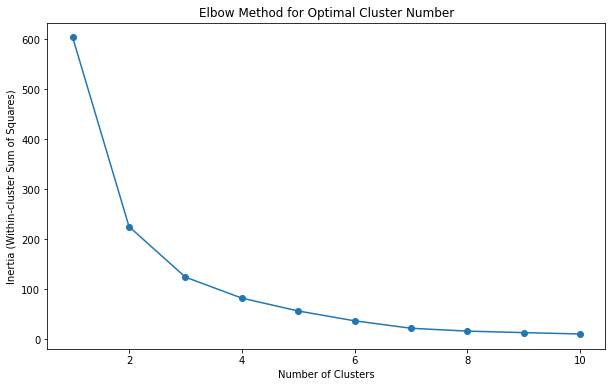

In [18]:
max_clusters = 10
inertia_values = []

for num_clusters in range(1, max_clusters + 1):
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    kmeans.fit(X)
    inertia_values.append(kmeans.inertia_)

# Plot the Elbow Method graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, max_clusters + 1), inertia_values, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (Within-cluster Sum of Squares)')
plt.title('Elbow Method for Optimal Cluster Number')
plt.show()

In [19]:
num_clusters = 7
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(X)

# Print cluster labels
print("Cluster Labels:", cluster_labels)

Cluster Labels: [2 5 2 ... 0 3 5]


In [20]:
len(cluster_labels)

2714

In [21]:
app_train_encode["SurgeryName"] = cluster_labels

In [22]:
app_train_encode.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [23]:
test_surgery_embeddings = [np.mean([fasttext_model.wv[word] for word in surgery], axis=0) for surgery in sentences_test]
X_test = np.vstack(test_surgery_embeddings)

In [24]:
test_cluster_labels = kmeans.predict(X_test)

In [25]:
len(test_cluster_labels)

1211

In [26]:
test_cluster_labels

array([5, 2, 1, ..., 2, 1, 1])

In [27]:
app_test_encode["SurgeryName"] = test_cluster_labels

In [28]:
app_train_encode.head()


,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [29]:
app_test_encode.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [30]:
app_train_encode_cluster = pd.get_dummies(app_train_encode, columns=['SurgeryName'], prefix=['SurgeryName'])


In [31]:
app_train_encode_cluster.head()

,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first_5_E-Z,combi

In [32]:
app_test_encode_cluster = pd.get_dummies(app_test_encode, columns=['SurgeryName'], prefix=['SurgeryName'])


In [33]:
app_test_encode_cluster.head()

,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first_5_E-Z,combi

In [34]:
from sklearn.manifold import TSNE
import plotly.express as px

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(X)

# Create a DataFrame for t-SNE results
tsne_df = pd.DataFrame(tsne_results, columns=['tsne_1', 'tsne_2'])
tsne_df['Cluster'] = cluster_labels
tsne_df['SurgeryName'] = surgery_names_train

# Create hover data
hover_data = {
    'Surgery Name': tsne_df['SurgeryName']
}

# Plot t-SNE visualization with hue for clusters and surgery names using Plotly Express
fig = px.scatter(tsne_df, x='tsne_1', y='tsne_2', color='Cluster', hover_data=hover_data)

# Update layout for title and legend
fig.update_layout(
    title='t-SNE Visualization of Clustered Surgery Names',
    legend=dict(x=1, y=1, bgcolor='rgba(255, 255, 255, 0.5)')
)

# Show the interactive plot
fig.show()


c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



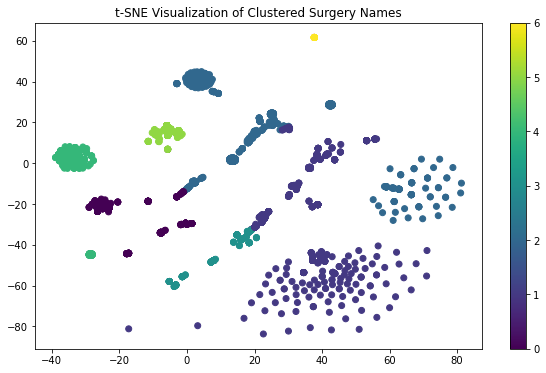

In [35]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(X)

# Plot the t-SNE visualization with cluster colors
plt.figure(figsize=(10, 6))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=cluster_labels, cmap='viridis')
plt.title('t-SNE Visualization of Clustered Surgery Names')
plt.colorbar()
plt.show()


In [36]:
models = encode_test(app_train_encode_cluster)

Train shape: (2442, 1352) | Val Shape: (272, 1352)
[0]	validation_0-rmse:4116.00431	validation_1-rmse:3982.43867
[1]	validation_0-rmse:3142.79865	validation_1-rmse:3024.27789


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2486.69702	validation_1-rmse:2403.62463
[3]	validation_0-rmse:2091.94776	validation_1-rmse:1993.18743
[4]	validation_0-rmse:1880.07269	validation_1-rmse:1743.31802
[5]	validation_0-rmse:1732.39495	validation_1-rmse:1565.70675
[6]	validation_0-rmse:1663.33247	validation_1-rmse:1459.74127
[7]	validation_0-rmse:1624.32735	validation_1-rmse:1372.99441
[8]	validation_0-rmse:1607.81223	validation_1-rmse:1334.24579
[9]	validation_0-rmse:1587.91387	validation_1-rmse:1285.73546
[10]	validation_0-rmse:1581.98889	validation_1-rmse:1262.39729
[11]	validation_0-rmse:1592.48374	validation_1-rmse:1227.07847
[12]	validation_0-rmse:1591.57112	validation_1-rmse:1210.61437
[13]	validation_0-rmse:1591.51783	validation_1-rmse:1188.32875
[14]	validation_0-rmse:1590.56987	validation_1-rmse:1178.30257
[15]	validation_0-rmse:1593.47565	validation_1-rmse:1169.73673
[16]	validation_0-rmse:1593.59109	validation_1-rmse:1163.88854
[17]	validation_0-rmse:1592.59211	validation_1-rmse:1154.83951


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2424.35233	validation_1-rmse:1981.78108
[4]	validation_0-rmse:2155.86826	validation_1-rmse:1724.63877
[5]	validation_0-rmse:2006.04717	validation_1-rmse:1571.87683
[6]	validation_0-rmse:1904.21422	validation_1-rmse:1470.85708
[7]	validation_0-rmse:1822.82532	validation_1-rmse:1378.56124
[8]	validation_0-rmse:1797.98283	validation_1-rmse:1343.84981
[9]	validation_0-rmse:1756.84463	validation_1-rmse:1314.21318
[10]	validation_0-rmse:1724.55613	validation_1-rmse:1271.98440
[11]	validation_0-rmse:1700.22081	validation_1-rmse:1235.90808
[12]	validation_0-rmse:1692.78704	validation_1-rmse:1208.79655
[13]	validation_0-rmse:1683.89538	validation_1-rmse:1197.54898
[14]	validation_0-rmse:1685.02471	validation_1-rmse:1186.51720
[15]	validation_0-rmse:1675.90070	validation_1-rmse:1179.04090
[16]	validation_0-rmse:1669.00022	validation_1-rmse:1171.39196
[17]	validation_0-rmse:1662.61732	validation_1-rmse:1163.00243
[18]	validation_0-rmse:1663.85659	validation_1-rmse:1154.40005

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2294.20114	validation_1-rmse:2405.23546
[3]	validation_0-rmse:1924.22392	validation_1-rmse:2002.75997
[4]	validation_0-rmse:1705.23600	validation_1-rmse:1734.91360
[5]	validation_0-rmse:1610.24962	validation_1-rmse:1577.35765
[6]	validation_0-rmse:1554.46560	validation_1-rmse:1480.06350
[7]	validation_0-rmse:1521.80334	validation_1-rmse:1383.02419
[8]	validation_0-rmse:1506.90396	validation_1-rmse:1330.77430
[9]	validation_0-rmse:1515.77972	validation_1-rmse:1295.42630
[10]	validation_0-rmse:1503.68059	validation_1-rmse:1273.48006
[11]	validation_0-rmse:1502.32263	validation_1-rmse:1251.96579
[12]	validation_0-rmse:1493.29469	validation_1-rmse:1234.06882
[13]	validation_0-rmse:1493.64745	validation_1-rmse:1221.08468
[14]	validation_0-rmse:1492.11679	validation_1-rmse:1214.21111
[15]	validation_0-rmse:1492.85395	validation_1-rmse:1199.75366
[16]	validation_0-rmse:1490.86182	validation_1-rmse:1191.40854
[17]	validation_0-rmse:1488.83591	validation_1-rmse:1168.51478


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:1879.56575	validation_1-rmse:2000.81796
[4]	validation_0-rmse:1701.27542	validation_1-rmse:1739.34747
[5]	validation_0-rmse:1599.14524	validation_1-rmse:1564.81533
[6]	validation_0-rmse:1547.37128	validation_1-rmse:1443.89506
[7]	validation_0-rmse:1541.71670	validation_1-rmse:1383.02133
[8]	validation_0-rmse:1522.02111	validation_1-rmse:1317.38978
[9]	validation_0-rmse:1519.24800	validation_1-rmse:1285.48405
[10]	validation_0-rmse:1520.04007	validation_1-rmse:1266.37411
[11]	validation_0-rmse:1510.82408	validation_1-rmse:1238.62297
[12]	validation_0-rmse:1506.96146	validation_1-rmse:1229.48073
[13]	validation_0-rmse:1504.76162	validation_1-rmse:1219.92940
[14]	validation_0-rmse:1501.94007	validation_1-rmse:1205.05932
[15]	validation_0-rmse:1490.00282	validation_1-rmse:1189.59988
[16]	validation_0-rmse:1487.98750	validation_1-rmse:1180.72304
[17]	validation_0-rmse:1489.21665	validation_1-rmse:1176.12328
[18]	validation_0-rmse:1487.20175	validation_1-rmse:1165.71206

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:1784.54646	validation_1-rmse:1995.44860
[4]	validation_0-rmse:1586.29797	validation_1-rmse:1741.32729
[5]	validation_0-rmse:1477.24061	validation_1-rmse:1574.27891
[6]	validation_0-rmse:1422.36840	validation_1-rmse:1464.91256
[7]	validation_0-rmse:1404.08217	validation_1-rmse:1406.01316
[8]	validation_0-rmse:1385.28647	validation_1-rmse:1362.49952
[9]	validation_0-rmse:1364.57209	validation_1-rmse:1316.38381
[10]	validation_0-rmse:1355.85811	validation_1-rmse:1278.89259
[11]	validation_0-rmse:1354.89098	validation_1-rmse:1261.69911
[12]	validation_0-rmse:1347.44621	validation_1-rmse:1244.35073
[13]	validation_0-rmse:1347.28681	validation_1-rmse:1231.88827
[14]	validation_0-rmse:1339.59397	validation_1-rmse:1221.50471
[15]	validation_0-rmse:1339.97391	validation_1-rmse:1213.78725
[16]	validation_0-rmse:1321.75358	validation_1-rmse:1186.57742
[17]	validation_0-rmse:1320.18344	validation_1-rmse:1182.28360
[18]	validation_0-rmse:1317.15038	validation_1-rmse:1175.66050

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2495.28903	validation_1-rmse:2401.69085
[3]	validation_0-rmse:2173.60461	validation_1-rmse:1997.80400
[4]	validation_0-rmse:1958.81272	validation_1-rmse:1723.46725
[5]	validation_0-rmse:1835.62017	validation_1-rmse:1553.36114
[6]	validation_0-rmse:1778.12023	validation_1-rmse:1451.15508
[7]	validation_0-rmse:1747.23694	validation_1-rmse:1385.09708
[8]	validation_0-rmse:1718.11848	validation_1-rmse:1312.35321
[9]	validation_0-rmse:1699.72705	validation_1-rmse:1283.13115
[10]	validation_0-rmse:1699.28618	validation_1-rmse:1253.19580
[11]	validation_0-rmse:1695.01531	validation_1-rmse:1222.71236
[12]	validation_0-rmse:1689.84152	validation_1-rmse:1210.82183
[13]	validation_0-rmse:1688.67603	validation_1-rmse:1202.17327
[14]	validation_0-rmse:1693.62248	validation_1-rmse:1184.71711
[15]	validation_0-rmse:1692.78470	validation_1-rmse:1178.99864
[16]	validation_0-rmse:1690.96857	validation_1-rmse:1162.32915
[17]	validation_0-rmse:1690.70028	validation_1-rmse:1148.33095


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2720.65803	validation_1-rmse:2380.76283
[3]	validation_0-rmse:2334.52773	validation_1-rmse:1960.93169
[4]	validation_0-rmse:2105.31481	validation_1-rmse:1710.80556
[5]	validation_0-rmse:1973.56060	validation_1-rmse:1548.78459
[6]	validation_0-rmse:1894.29674	validation_1-rmse:1446.75284
[7]	validation_0-rmse:1855.71516	validation_1-rmse:1371.70384
[8]	validation_0-rmse:1830.83146	validation_1-rmse:1332.87117
[9]	validation_0-rmse:1827.08874	validation_1-rmse:1270.20229
[10]	validation_0-rmse:1778.48789	validation_1-rmse:1228.77779
[11]	validation_0-rmse:1771.28231	validation_1-rmse:1207.82611
[12]	validation_0-rmse:1770.19478	validation_1-rmse:1197.79444
[13]	validation_0-rmse:1765.37147	validation_1-rmse:1190.73931
[14]	validation_0-rmse:1761.63956	validation_1-rmse:1179.92896
[15]	validation_0-rmse:1758.20463	validation_1-rmse:1173.78605
[16]	validation_0-rmse:1752.39312	validation_1-rmse:1169.36572
[17]	validation_0-rmse:1751.76600	validation_1-rmse:1160.65195


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2187.01816	validation_1-rmse:2002.65586
[4]	validation_0-rmse:1939.72598	validation_1-rmse:1739.87569
[5]	validation_0-rmse:1805.11359	validation_1-rmse:1573.21337
[6]	validation_0-rmse:1737.72733	validation_1-rmse:1478.00246
[7]	validation_0-rmse:1675.78684	validation_1-rmse:1380.47250
[8]	validation_0-rmse:1632.78075	validation_1-rmse:1324.81448
[9]	validation_0-rmse:1604.99057	validation_1-rmse:1295.02928
[10]	validation_0-rmse:1599.21655	validation_1-rmse:1276.43501
[11]	validation_0-rmse:1594.38044	validation_1-rmse:1246.85221
[12]	validation_0-rmse:1590.12147	validation_1-rmse:1235.09376
[13]	validation_0-rmse:1569.28768	validation_1-rmse:1212.56266
[14]	validation_0-rmse:1562.86839	validation_1-rmse:1191.86044
[15]	validation_0-rmse:1562.13812	validation_1-rmse:1184.67616
[16]	validation_0-rmse:1557.98433	validation_1-rmse:1177.98551
[17]	validation_0-rmse:1559.66132	validation_1-rmse:1170.90477
[18]	validation_0-rmse:1562.54360	validation_1-rmse:1165.99957

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:1953.06722	validation_1-rmse:2009.21816
[4]	validation_0-rmse:1749.06778	validation_1-rmse:1733.08852
[5]	validation_0-rmse:1657.04724	validation_1-rmse:1564.76823
[6]	validation_0-rmse:1615.01565	validation_1-rmse:1464.85454
[7]	validation_0-rmse:1550.58767	validation_1-rmse:1374.47725
[8]	validation_0-rmse:1538.75908	validation_1-rmse:1326.43083
[9]	validation_0-rmse:1525.49621	validation_1-rmse:1279.45302
[10]	validation_0-rmse:1517.76665	validation_1-rmse:1259.19249
[11]	validation_0-rmse:1495.55212	validation_1-rmse:1231.85093
[12]	validation_0-rmse:1493.48033	validation_1-rmse:1222.17874
[13]	validation_0-rmse:1491.57861	validation_1-rmse:1212.20168
[14]	validation_0-rmse:1492.94399	validation_1-rmse:1199.57948
[15]	validation_0-rmse:1484.79019	validation_1-rmse:1187.78178
[16]	validation_0-rmse:1494.09669	validation_1-rmse:1178.46001
[17]	validation_0-rmse:1495.78506	validation_1-rmse:1164.83859
[18]	validation_0-rmse:1494.31165	validation_1-rmse:1160.32074

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2599.31341	validation_1-rmse:2410.23971
[3]	validation_0-rmse:2249.30691	validation_1-rmse:2014.92236
[4]	validation_0-rmse:2022.28082	validation_1-rmse:1749.49418
[5]	validation_0-rmse:1911.31249	validation_1-rmse:1582.78639
[6]	validation_0-rmse:1852.23866	validation_1-rmse:1485.02174
[7]	validation_0-rmse:1810.52034	validation_1-rmse:1414.83115
[8]	validation_0-rmse:1719.26792	validation_1-rmse:1331.93700
[9]	validation_0-rmse:1696.40219	validation_1-rmse:1300.04126
[10]	validation_0-rmse:1697.73518	validation_1-rmse:1276.30874
[11]	validation_0-rmse:1685.15661	validation_1-rmse:1247.45537
[12]	validation_0-rmse:1680.77614	validation_1-rmse:1231.77347
[13]	validation_0-rmse:1679.71290	validation_1-rmse:1222.82070
[14]	validation_0-rmse:1652.89020	validation_1-rmse:1204.69588
[15]	validation_0-rmse:1648.07722	validation_1-rmse:1197.58877
[16]	validation_0-rmse:1616.04147	validation_1-rmse:1163.77870
[17]	validation_0-rmse:1613.30978	validation_1-rmse:1154.51184


In [37]:
sample_submission = encode_submission(app_test_encode_cluster, models)

In [38]:
sample_submission.head()

,ID,ElapsedTime(second)
0,1669,2631
1,2091,3165
2,585,7703
3,1455,7869
4,1801,2316


In [39]:
sample_submission.shape

(1211, 2)

In [40]:
sample_submission.to_csv("mentorship_surgeryname_word_embeddings_cluster_one_hot_kmeans7.csv", index = False)

In [41]:
app_train_encode.shape

(2714, 1347)

## Encoding with Global-Vectors

In [8]:
from sklearn.cluster import KMeans
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from sklearn.manifold import TSNE

In [9]:
surgery_names_train = app_train_encode["SurgeryName"].to_list()

In [10]:
string_list_train = [str(element) for element in surgery_names_train]

In [11]:
surgery_names_test = app_test_encode["SurgeryName"].to_list()

In [12]:
string_list_test = [str(element) for element in surgery_names_test]


In [9]:
surgery_names_train = app_train_encode["SurgeryName"].to_list()

In [10]:
surgery_names_test = app_test_encode["SurgeryName"].to_list()

In [13]:
all_surgery_names = string_list_train + string_list_test

In [14]:
len(all_surgery_names)

3925

In [15]:
tagged_data = [TaggedDocument(words=surgery.split(), tags=[str(idx)]) for idx, surgery in enumerate(all_surgery_names)]

In [16]:
embedding_dim = 100
doc2vec_model = Doc2Vec(vector_size=embedding_dim, window=5, min_count=1, dm=1, epochs=10, seed=42)
doc2vec_model.build_vocab(tagged_data)
doc2vec_model.train(tagged_data, total_examples=doc2vec_model.corpus_count, epochs=doc2vec_model.epochs)


In [17]:
surgery_embeddings = [doc2vec_model.dv[str(idx)] for idx in range(len(all_surgery_names))]

In [18]:
type(surgery_embeddings)

list

In [19]:
train_results = surgery_embeddings[:2714]
test_results = surgery_embeddings[2714:]

c:\Users\Furka\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1040: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=11.
  "KMeans is known to have a memory leak on Windows "


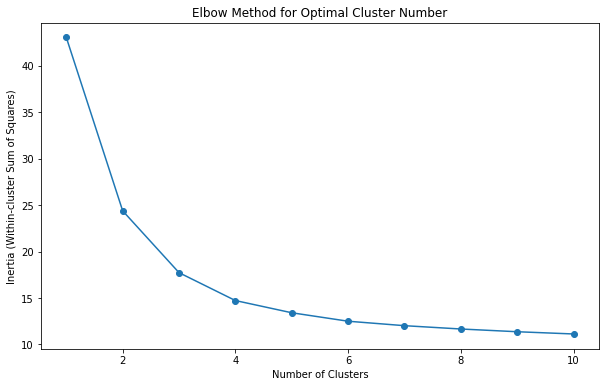

In [20]:
max_clusters = 10
inertia_values = []

for num_clusters in range(1, max_clusters + 1):
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    kmeans.fit(train_results)
    inertia_values.append(kmeans.inertia_)

# Plot the Elbow Method graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, max_clusters + 1), inertia_values, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (Within-cluster Sum of Squares)')
plt.title('Elbow Method for Optimal Cluster Number')
plt.show()

In [21]:
# Perform K-means clustering
num_clusters = 3
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(train_results)

# Print cluster labels
print("Cluster Labels:", cluster_labels)

Cluster Labels: [0 0 0 ... 0 2 2]


In [23]:
test_cluster_labels = kmeans.predict(test_results)


In [24]:
app_train_encode.shape

(2714, 1347)

In [17]:
app_test_encode.shape

(1211, 1346)

In [24]:
len(cluster_labels)

2714

In [25]:
app_train_encode["SurgeryName"] = cluster_labels

In [26]:
app_train_encode.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [27]:
app_test_encode["SurgeryName"] = test_cluster_labels

In [28]:
app_train_encode.head()


,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [29]:
app_test_encode.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [30]:
app_train_encode_cluster = pd.get_dummies(app_train_encode, columns=['SurgeryName'], prefix=['SurgeryName'])


In [31]:
app_train_encode_cluster.head()

,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first_5_E-Z,combi

In [32]:
app_test_encode_cluster = pd.get_dummies(app_test_encode, columns=['SurgeryName'], prefix=['SurgeryName'])


In [33]:
app_test_encode_cluster.head()

,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first_5_E-Z,combi

In [34]:
from sklearn.manifold import TSNE
import plotly.express as px

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(train_results)

# Create a DataFrame for t-SNE results
tsne_df = pd.DataFrame(tsne_results, columns=['tsne_1', 'tsne_2'])
tsne_df['Cluster'] = cluster_labels
tsne_df['SurgeryName'] = surgery_names_train

# Create hover data
hover_data = {
    'Surgery Name': tsne_df['SurgeryName']
}

# Plot t-SNE visualization with hue for clusters and surgery names using Plotly Express
fig = px.scatter(tsne_df, x='tsne_1', y='tsne_2', color='Cluster', hover_data=hover_data)

# Update layout for title and legend
fig.update_layout(
    title='t-SNE Visualization of Clustered Surgery Names',
    legend=dict(x=1, y=1, bgcolor='rgba(255, 255, 255, 0.5)')
)

# Show the interactive plot
fig.show()


c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



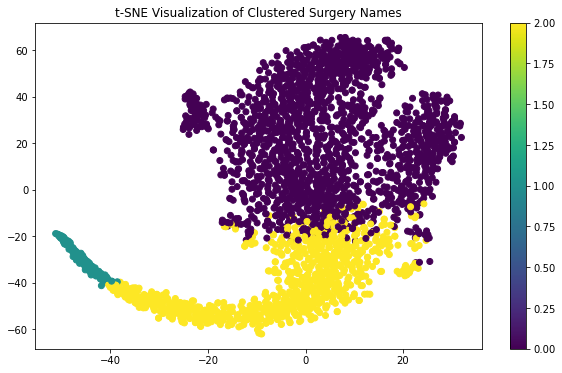

In [35]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(train_results)

# Plot the t-SNE visualization with cluster colors
plt.figure(figsize=(10, 6))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=cluster_labels, cmap='viridis')
plt.title('t-SNE Visualization of Clustered Surgery Names')
plt.colorbar()
plt.show()


In [36]:
models = encode_test(app_train_encode_cluster)

Train shape: (2442, 1348) | Val Shape: (272, 1348)
[0]	validation_0-rmse:4116.83780	validation_1-rmse:3982.44681
[1]	validation_0-rmse:3146.15494	validation_1-rmse:3024.50090
[2]	validation_0-rmse:2494.36980	validation_1-rmse:2400.39490


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2095.96638	validation_1-rmse:1980.33036
[4]	validation_0-rmse:1861.82329	validation_1-rmse:1732.08743
[5]	validation_0-rmse:1723.22520	validation_1-rmse:1558.03188
[6]	validation_0-rmse:1646.23764	validation_1-rmse:1454.61400
[7]	validation_0-rmse:1614.24352	validation_1-rmse:1386.35621
[8]	validation_0-rmse:1590.60658	validation_1-rmse:1343.91056
[9]	validation_0-rmse:1600.57973	validation_1-rmse:1297.21945
[10]	validation_0-rmse:1591.07056	validation_1-rmse:1250.45806
[11]	validation_0-rmse:1580.90718	validation_1-rmse:1234.45851
[12]	validation_0-rmse:1566.54702	validation_1-rmse:1208.95777
[13]	validation_0-rmse:1559.46363	validation_1-rmse:1199.17115
[14]	validation_0-rmse:1553.42346	validation_1-rmse:1181.67165
[15]	validation_0-rmse:1560.27766	validation_1-rmse:1175.87160
[16]	validation_0-rmse:1570.73343	validation_1-rmse:1160.79192
[17]	validation_0-rmse:1569.16133	validation_1-rmse:1146.29939
[18]	validation_0-rmse:1564.90284	validation_1-rmse:1130.90025

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[1]	validation_0-rmse:3518.51888	validation_1-rmse:3000.92431
[2]	validation_0-rmse:2840.75049	validation_1-rmse:2375.53903
[3]	validation_0-rmse:2407.11159	validation_1-rmse:1982.94290
[4]	validation_0-rmse:2152.08196	validation_1-rmse:1729.37680
[5]	validation_0-rmse:2005.31692	validation_1-rmse:1575.25681
[6]	validation_0-rmse:1919.32790	validation_1-rmse:1482.38282
[7]	validation_0-rmse:1825.44599	validation_1-rmse:1378.60881
[8]	validation_0-rmse:1780.61439	validation_1-rmse:1334.88911
[9]	validation_0-rmse:1757.86724	validation_1-rmse:1282.67467
[10]	validation_0-rmse:1722.72345	validation_1-rmse:1249.69982
[11]	validation_0-rmse:1703.17562	validation_1-rmse:1219.66339
[12]	validation_0-rmse:1691.24065	validation_1-rmse:1210.88288
[13]	validation_0-rmse:1682.09761	validation_1-rmse:1201.98601
[14]	validation_0-rmse:1682.74862	validation_1-rmse:1193.42808
[15]	validation_0-rmse:1673.01938	validation_1-rmse:1188.64718
[16]	validation_0-rmse:1664.87288	validation_1-rmse:1182.81277
[

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:1919.85363	validation_1-rmse:2006.02606
[4]	validation_0-rmse:1722.92357	validation_1-rmse:1764.48582
[5]	validation_0-rmse:1603.27968	validation_1-rmse:1581.12451
[6]	validation_0-rmse:1538.99655	validation_1-rmse:1474.11656
[7]	validation_0-rmse:1512.05965	validation_1-rmse:1404.10350
[8]	validation_0-rmse:1492.66436	validation_1-rmse:1340.88163
[9]	validation_0-rmse:1486.94036	validation_1-rmse:1303.33673
[10]	validation_0-rmse:1483.82359	validation_1-rmse:1282.11795
[11]	validation_0-rmse:1477.13446	validation_1-rmse:1267.88066
[12]	validation_0-rmse:1484.14273	validation_1-rmse:1240.58753
[13]	validation_0-rmse:1480.39972	validation_1-rmse:1225.66200
[14]	validation_0-rmse:1480.54616	validation_1-rmse:1219.27316
[15]	validation_0-rmse:1478.36986	validation_1-rmse:1211.79602
[16]	validation_0-rmse:1482.29576	validation_1-rmse:1194.30651
[17]	validation_0-rmse:1481.58324	validation_1-rmse:1187.05796
[18]	validation_0-rmse:1484.70174	validation_1-rmse:1174.40697

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2207.59699	validation_1-rmse:2404.08806
[3]	validation_0-rmse:1889.51159	validation_1-rmse:2004.00573
[4]	validation_0-rmse:1729.48774	validation_1-rmse:1756.85249
[5]	validation_0-rmse:1627.84823	validation_1-rmse:1583.51088
[6]	validation_0-rmse:1583.00607	validation_1-rmse:1481.53110
[7]	validation_0-rmse:1565.68688	validation_1-rmse:1425.89175
[8]	validation_0-rmse:1546.52506	validation_1-rmse:1380.17240
[9]	validation_0-rmse:1508.49094	validation_1-rmse:1320.04855
[10]	validation_0-rmse:1520.18243	validation_1-rmse:1296.39481
[11]	validation_0-rmse:1508.81963	validation_1-rmse:1269.44333
[12]	validation_0-rmse:1506.95748	validation_1-rmse:1254.92688
[13]	validation_0-rmse:1503.52428	validation_1-rmse:1244.62605
[14]	validation_0-rmse:1502.17559	validation_1-rmse:1236.30373
[15]	validation_0-rmse:1510.44070	validation_1-rmse:1227.16106
[16]	validation_0-rmse:1525.06104	validation_1-rmse:1202.18460
[17]	validation_0-rmse:1522.64989	validation_1-rmse:1194.64224


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:1792.14940	validation_1-rmse:2003.95789
[4]	validation_0-rmse:1589.86478	validation_1-rmse:1757.06531
[5]	validation_0-rmse:1485.05008	validation_1-rmse:1589.69929
[6]	validation_0-rmse:1435.79108	validation_1-rmse:1489.61034
[7]	validation_0-rmse:1405.46887	validation_1-rmse:1395.26884
[8]	validation_0-rmse:1393.78653	validation_1-rmse:1355.16177
[9]	validation_0-rmse:1392.08399	validation_1-rmse:1326.82193
[10]	validation_0-rmse:1379.21209	validation_1-rmse:1288.71530
[11]	validation_0-rmse:1377.38312	validation_1-rmse:1272.99360
[12]	validation_0-rmse:1375.41998	validation_1-rmse:1263.92343
[13]	validation_0-rmse:1370.33117	validation_1-rmse:1245.45265
[14]	validation_0-rmse:1367.82551	validation_1-rmse:1239.28891
[15]	validation_0-rmse:1368.71995	validation_1-rmse:1234.41443
[16]	validation_0-rmse:1352.30108	validation_1-rmse:1223.85767
[17]	validation_0-rmse:1353.39772	validation_1-rmse:1218.71494
[18]	validation_0-rmse:1354.66714	validation_1-rmse:1212.72877

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2494.83262	validation_1-rmse:2403.08039
[3]	validation_0-rmse:2163.86633	validation_1-rmse:2000.00565
[4]	validation_0-rmse:1942.45343	validation_1-rmse:1740.27765
[5]	validation_0-rmse:1818.50597	validation_1-rmse:1566.57923
[6]	validation_0-rmse:1761.27628	validation_1-rmse:1457.48265
[7]	validation_0-rmse:1725.58140	validation_1-rmse:1397.80366
[8]	validation_0-rmse:1707.24561	validation_1-rmse:1321.40693
[9]	validation_0-rmse:1704.93186	validation_1-rmse:1278.03705
[10]	validation_0-rmse:1696.55101	validation_1-rmse:1246.53962
[11]	validation_0-rmse:1691.81327	validation_1-rmse:1216.13156
[12]	validation_0-rmse:1695.68129	validation_1-rmse:1201.96874
[13]	validation_0-rmse:1688.89857	validation_1-rmse:1190.26055
[14]	validation_0-rmse:1684.90941	validation_1-rmse:1175.75703
[15]	validation_0-rmse:1680.03943	validation_1-rmse:1167.58906
[16]	validation_0-rmse:1675.43365	validation_1-rmse:1158.27616
[17]	validation_0-rmse:1679.61630	validation_1-rmse:1141.19717


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2719.95858	validation_1-rmse:2382.39248
[3]	validation_0-rmse:2337.27679	validation_1-rmse:1964.69087
[4]	validation_0-rmse:2085.83347	validation_1-rmse:1701.55181
[5]	validation_0-rmse:1950.39617	validation_1-rmse:1551.01091
[6]	validation_0-rmse:1863.39275	validation_1-rmse:1438.01045
[7]	validation_0-rmse:1823.74092	validation_1-rmse:1370.55456
[8]	validation_0-rmse:1802.68993	validation_1-rmse:1330.18902
[9]	validation_0-rmse:1747.83811	validation_1-rmse:1280.17499
[10]	validation_0-rmse:1747.30225	validation_1-rmse:1244.39350
[11]	validation_0-rmse:1745.87326	validation_1-rmse:1228.06679
[12]	validation_0-rmse:1739.11092	validation_1-rmse:1212.21560
[13]	validation_0-rmse:1709.87155	validation_1-rmse:1190.58092
[14]	validation_0-rmse:1708.55363	validation_1-rmse:1181.35877
[15]	validation_0-rmse:1698.43873	validation_1-rmse:1175.95154
[16]	validation_0-rmse:1692.79657	validation_1-rmse:1166.11034
[17]	validation_0-rmse:1691.55937	validation_1-rmse:1161.22611


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2571.45017	validation_1-rmse:2401.01766
[3]	validation_0-rmse:2175.80071	validation_1-rmse:2004.48443
[4]	validation_0-rmse:1925.31710	validation_1-rmse:1739.58862
[5]	validation_0-rmse:1754.47816	validation_1-rmse:1570.35905
[6]	validation_0-rmse:1693.69062	validation_1-rmse:1467.17732
[7]	validation_0-rmse:1649.70584	validation_1-rmse:1403.17882
[8]	validation_0-rmse:1635.90260	validation_1-rmse:1360.11182
[9]	validation_0-rmse:1612.69994	validation_1-rmse:1290.63567
[10]	validation_0-rmse:1594.63187	validation_1-rmse:1270.92429
[11]	validation_0-rmse:1595.70764	validation_1-rmse:1244.55508
[12]	validation_0-rmse:1574.50801	validation_1-rmse:1223.52843
[13]	validation_0-rmse:1565.36282	validation_1-rmse:1213.46656
[14]	validation_0-rmse:1567.42946	validation_1-rmse:1206.21987
[15]	validation_0-rmse:1569.88619	validation_1-rmse:1201.18085
[16]	validation_0-rmse:1574.25763	validation_1-rmse:1178.75502
[17]	validation_0-rmse:1581.23325	validation_1-rmse:1155.94690


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2312.57571	validation_1-rmse:2424.63916
[3]	validation_0-rmse:1984.27489	validation_1-rmse:2020.96701
[4]	validation_0-rmse:1793.39490	validation_1-rmse:1746.98368
[5]	validation_0-rmse:1685.33698	validation_1-rmse:1577.76754
[6]	validation_0-rmse:1648.00043	validation_1-rmse:1478.83731
[7]	validation_0-rmse:1613.09456	validation_1-rmse:1398.21144
[8]	validation_0-rmse:1602.85474	validation_1-rmse:1353.17806
[9]	validation_0-rmse:1579.70959	validation_1-rmse:1302.63157
[10]	validation_0-rmse:1553.00809	validation_1-rmse:1271.28607
[11]	validation_0-rmse:1542.40988	validation_1-rmse:1244.11305
[12]	validation_0-rmse:1539.92842	validation_1-rmse:1233.21191
[13]	validation_0-rmse:1513.19514	validation_1-rmse:1211.23050
[14]	validation_0-rmse:1513.04351	validation_1-rmse:1203.01589
[15]	validation_0-rmse:1512.66035	validation_1-rmse:1196.15128
[16]	validation_0-rmse:1516.76062	validation_1-rmse:1186.99001
[17]	validation_0-rmse:1513.35318	validation_1-rmse:1175.07352


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2553.31567	validation_1-rmse:2403.50460
[3]	validation_0-rmse:2183.24877	validation_1-rmse:2001.33573
[4]	validation_0-rmse:1971.16741	validation_1-rmse:1738.73507
[5]	validation_0-rmse:1814.17316	validation_1-rmse:1566.34478
[6]	validation_0-rmse:1765.10900	validation_1-rmse:1461.54932
[7]	validation_0-rmse:1715.88554	validation_1-rmse:1391.17897
[8]	validation_0-rmse:1694.19349	validation_1-rmse:1352.00611
[9]	validation_0-rmse:1676.94930	validation_1-rmse:1308.33384
[10]	validation_0-rmse:1657.96024	validation_1-rmse:1272.29945
[11]	validation_0-rmse:1622.87439	validation_1-rmse:1248.15280
[12]	validation_0-rmse:1622.23744	validation_1-rmse:1238.89555
[13]	validation_0-rmse:1620.49471	validation_1-rmse:1224.78018
[14]	validation_0-rmse:1623.78558	validation_1-rmse:1215.87095
[15]	validation_0-rmse:1627.08585	validation_1-rmse:1209.54673
[16]	validation_0-rmse:1627.54472	validation_1-rmse:1203.88727
[17]	validation_0-rmse:1636.42580	validation_1-rmse:1193.75562


In [37]:
sample_submission = encode_submission(app_test_encode_cluster, models)

In [38]:
sample_submission.head()

,ID,ElapsedTime(second)
0,1669,2549
1,2091,3325
2,585,7971
3,1455,7871
4,1801,2316


In [39]:
sample_submission.shape

(1211, 2)

In [42]:
sample_submission.to_csv("mentorship_surgeryname_word_embeddings_doc2vec_cluster_one_hot_kmeans3.csv", index = False)

## Encoding with Simple Inverse Frequency (Fasttext)

In [8]:
from gensim.models import FastText
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

In [9]:
surgery_names_train = app_train_encode["SurgeryName"].to_list()

In [10]:
string_list_train = [str(element) for element in surgery_names_train]

In [11]:
surgery_names_test = app_test_encode["SurgeryName"].to_list()

In [12]:
string_list_test = [str(element) for element in surgery_names_test]


In [13]:
string_list_train = [surgery.replace('|', ' ') for surgery in string_list_train]
string_list_test = [surgery.replace('|', ' ') for surgery in string_list_test]


In [14]:
import re
def custom_tokenizer(text):
    return re.findall(r'\b\w+\b', text)

In [15]:
tfidf_vectorizer = TfidfVectorizer(tokenizer=custom_tokenizer)
tfidf_matrix_train = tfidf_vectorizer.fit_transform(string_list_train)
tfidf_matrix_test = tfidf_vectorizer.transform(string_list_test)

In [16]:
words = tfidf_vectorizer.get_feature_names()
idf_values = tfidf_vectorizer.idf_

c:\Users\Furka\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [17]:
embedding_dim = 100
fasttext_model = FastText(sentences=[surgery.split() for surgery in string_list_train], vector_size=embedding_dim, window=5, min_count=1, sg=1)


In [18]:
sif_embeddings_train = []
for doc in string_list_train:
    tokens = custom_tokenizer(doc)
    doc_vector = np.zeros(embedding_dim)
    words_in_vocab = 0
    for word in tokens:
        if word in fasttext_model.wv.key_to_index:
            word_vector = fasttext_model.wv[word]
            idf_index = words.index(word) if word in words else -1  # Default index to -1 if word not in words list
            weight = idf_values[idf_index] if idf_index >= 0 else 1.0  # Default weight to 1.0 if index is -1
            doc_vector += (weight / (weight + 1)) * word_vector  # SIF weighting
            words_in_vocab += 1
    if words_in_vocab > 0:
        doc_vector /= words_in_vocab
    sif_embeddings_train.append(doc_vector)

# Perform K-means clustering on train data embeddings
X_train = np.array(sif_embeddings_train)

In [19]:
X_train.shape

(2714, 100)

In [42]:
X_train

array([[ 0.0571149 ,  0.05784151,  0.01051309, ..., -0.12125596,
        -0.0140222 , -0.00266073],
       [ 0.01412931,  0.01861833,  0.00082831, ..., -0.03740743,
        -0.00368221, -0.00326133],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 0.03159013,  0.04366608,  0.02097185, ..., -0.10370408,
        -0.00616711,  0.00886302],
       [ 0.1395653 ,  0.13607451,  0.02172086, ..., -0.28057478,
        -0.04025154, -0.00261896],
       [ 0.00425441,  0.00387171,  0.00130683, ..., -0.0068911 ,
        -0.00109761,  0.00036704]])

c:\Users\Furka\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1040: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=11.
  "KMeans is known to have a memory leak on Windows "


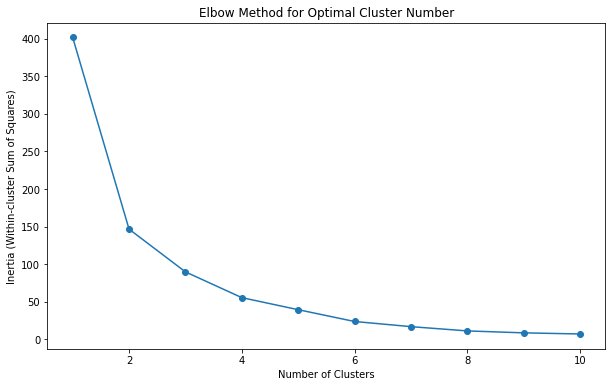

In [20]:
max_clusters = 10
inertia_values = []

for num_clusters in range(1, max_clusters + 1):
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    kmeans.fit(X_train)
    inertia_values.append(kmeans.inertia_)

# Plot the Elbow Method graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, max_clusters + 1), inertia_values, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (Within-cluster Sum of Squares)')
plt.title('Elbow Method for Optimal Cluster Number')
plt.show()

In [21]:
num_clusters = 4
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(X_train)

# Print cluster labels
print("Cluster Labels:", cluster_labels)

Cluster Labels: [3 0 0 ... 3 2 0]


In [22]:
len(cluster_labels)

2714

In [23]:
app_train_encode["SurgeryName"] = cluster_labels

In [24]:
app_train_encode.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [25]:
sif_embeddings_test = []
for doc in string_list_test:
    tokens = custom_tokenizer(doc)
    doc_vector = np.zeros(embedding_dim)
    words_in_vocab = 0
    for word in tokens:
        if word in fasttext_model.wv.key_to_index:
            word_vector = fasttext_model.wv[word]
            idf_index = words.index(word) if word in words else -1  # Default index to -1 if word not in words list
            weight = idf_values[idf_index] if idf_index >= 0 else 1.0  # Default weight to 1.0 if index is -1
            doc_vector += (weight / (weight + 1)) * word_vector  # SIF weighting
            words_in_vocab += 1
    if words_in_vocab > 0:
        doc_vector /= words_in_vocab
    sif_embeddings_test.append(doc_vector)

# Perform K-means clustering on test data embeddings
X_test = np.array(sif_embeddings_test)

In [26]:
app_test_encode.shape

(1211, 1346)

In [27]:
X_test.shape

(1211, 100)

In [28]:
test_cluster_labels = kmeans.predict(X_test)

In [29]:
len(test_cluster_labels)

1211

In [30]:
test_cluster_labels

array([0, 3, 1, ..., 1, 1, 1])

In [31]:
app_test_encode["SurgeryName"] = test_cluster_labels

In [32]:
app_train_encode.head()


,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [33]:
app_test_encode.head()

,SurgeryName,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first

In [34]:
app_train_encode_cluster = pd.get_dummies(app_train_encode, columns=['SurgeryName'], prefix=['SurgeryName'])


In [35]:
app_train_encode_cluster.head()

,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first_5_E-Z,combi

In [36]:
app_test_encode_cluster = pd.get_dummies(app_test_encode, columns=['SurgeryName'], prefix=['SurgeryName'])


In [37]:
app_test_encode_cluster.head()

,Age,Any_NaN_Diagnos,SurgeryGroup_Sum,SurgeryGroup_Count,SurgeryGroup_Avg,SurgeryGroup_Std,SurgeryGroup_Max,SurgeryGroup_Min,AnesthesiaType_Epidural Anestezi,AnesthesiaType_Epidural ve Genel Anestezi,AnesthesiaType_Genel Anestezi,AnesthesiaType_Kombine Spinal Epidural Anestezi,AnesthesiaType_Lokal Anestezi,AnesthesiaType_Rejyonel Sinir Blo?u,AnesthesiaType_Sedo Analjezi,AnesthesiaType_Spinal Anestezi,AnesthesiaType_Spinal ve Genel Anestezi,Sex_MALE,Service_GENEL CERRAH? SERV?S?,Service_GENEL KARMA CERRAH? SERV?S?,Service_GÖZ HASTALIKLARI SERV?S?,Service_KADIN DO?UM SERV?S?,Service_KBB SERV?S?,Service_KVC SERV?S?,Service_NÖRO??RÜRJ? SERV?S?,Service_ORTOPED? SERV?S?,Service_PLAST?K CERRAH?,Service_ÜROLOJ? SERV?S?,DoctorID_2,DoctorID_3,DoctorID_4,DoctorID_5,DoctorID_6,DoctorID_8,DoctorID_9,DoctorID_10,DoctorID_11,DoctorID_13,DoctorID_14,DoctorID_15,DoctorID_16,DoctorID_17,DoctorID_18,DoctorID_19,DoctorID_20,DoctorID_21,DoctorID_22,DoctorID_23,DoctorID_24,DoctorID_25,DoctorID_26,DoctorID_27,DoctorID_28,DoctorID_29,DoctorID_30,DoctorID_31,DoctorID_32,DoctorID_33,DoctorID_34,DoctorID_35,DoctorID_36,DoctorID_37,DoctorID_39,DoctorID_40,DoctorID_41,DoctorID_42,DoctorID_43,DoctorID_45,DoctorID_46,DoctorID_47,DoctorID_48,DoctorID_49,AnaesthetistID_1,AnaesthetistID_2,AnaesthetistID_3,AnaesthetistID_4,AnaesthetistID_5,AnaesthetistID_6,AnaesthetistID_7,AnaesthetistID_8,AnaesthetistID_9,AnaesthetistID_10,AnaesthetistID_11,AnaesthetistID_12,AnaesthetistID_13,AnaesthetistID_14,AnaesthetistID_15,AnaesthetistID_16,combination_first_1_A,combination_first_1_C,combination_first_1_D,combination_first_1_E,combination_first_1_F,combination_first_1_G,combination_first_1_H,combination_first_1_I,combination_first_1_J,combination_first_1_K,combination_first_1_L,combination_first_1_M,combination_first_1_N,combination_first_1_Q,combination_first_1_R,combination_first_1_S,combination_first_1_T,combination_first_1_W,combination_first_1_Y,combination_first_1_Z,combination_first_2_G,combination_first_2_H,combination_first_2_I,combination_first_2_J,combination_first_2_K,combination_first_2_L,combination_first_2_M,combination_first_2_N,combination_first_2_R,combination_first_2_S,combination_first_2_W,combination_first_2_Y,combination_first_2_Z,combination_first_3_A-M,combination_first_3_C-N,combination_first_3_C-R,combination_first_3_G-K,combination_first_3_H,combination_first_3_H-J,combination_first_3_H-L,combination_first_3_I-I,combination_first_3_I-K,combination_first_3_I-M,combination_first_3_I-Z,combination_first_3_J,combination_first_3_J-J,combination_first_3_J-M,combination_first_3_K,combination_first_3_K-K,combination_first_3_K-L,combination_first_3_K-M,combination_first_3_K-N,combination_first_3_K-R,combination_first_3_K-S,combination_first_3_K-Z,combination_first_3_L,combination_first_3_L-L,combination_first_3_L-M,combination_first_3_L-Z,combination_first_3_M,combination_first_3_M-M,combination_first_3_M-S,combination_first_3_M-Z,combination_first_3_N,combination_first_3_N-N,combination_first_3_N-R,combination_first_3_N-Z,combination_first_3_Q-Z,combination_first_3_R,combination_first_3_R-Z,combination_first_3_S-W,combination_first_3_S-Y,combination_first_3_S-Z,combination_first_3_T,combination_first_3_Z,combination_first_3_Z-Z,combination_first_4_D-M,combination_first_4_E-I,combination_first_4_E-M,combination_first_4_F-G,combination_first_4_G-K,combination_first_4_H-H,combination_first_4_I-I,combination_first_4_I-J,combination_first_4_I-K,combination_first_4_I-M,combination_first_4_J-J,combination_first_4_J-L,combination_first_4_J-M,combination_first_4_K-K,combination_first_4_K-L,combination_first_4_K-M,combination_first_4_K-R,combination_first_4_M,combination_first_4_M-M,combination_first_4_N,combination_first_4_N-N,combination_first_4_R,combination_first_4_T,combination_first_4_Z,combination_first_5_A-J,combination_first_5_C-J,combination_first_5_D-I,combination_first_5_D-M,combination_first_5_E-K,combination_first_5_E-M,combination_first_5_E-Z,combi

In [38]:
from sklearn.manifold import TSNE
import plotly.express as px

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(X_train)

# Create a DataFrame for t-SNE results
tsne_df = pd.DataFrame(tsne_results, columns=['tsne_1', 'tsne_2'])
tsne_df['Cluster'] = cluster_labels
tsne_df['SurgeryName'] = surgery_names_train

# Create hover data
hover_data = {
    'Surgery Name': tsne_df['SurgeryName']
}

# Plot t-SNE visualization with hue for clusters and surgery names using Plotly Express
fig = px.scatter(tsne_df, x='tsne_1', y='tsne_2', color='Cluster', hover_data=hover_data)

# Update layout for title and legend
fig.update_layout(
    title='t-SNE Visualization of Clustered Surgery Names',
    legend=dict(x=1, y=1, bgcolor='rgba(255, 255, 255, 0.5)')
)

# Show the interactive plot
fig.show()


c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

c:\Users\Furka\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



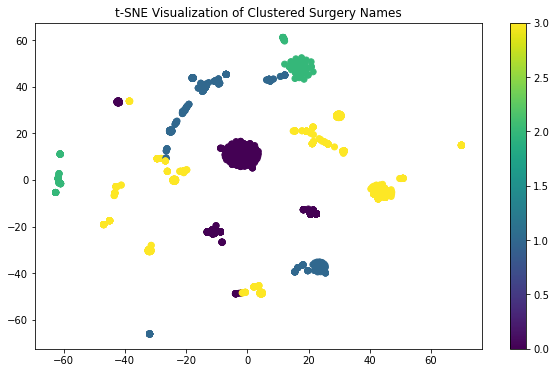

In [39]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(X_train)

# Plot the t-SNE visualization with cluster colors
plt.figure(figsize=(10, 6))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=cluster_labels, cmap='viridis')
plt.title('t-SNE Visualization of Clustered Surgery Names')
plt.colorbar()
plt.show()


In [40]:
models = encode_test(app_train_encode_cluster)

Train shape: (2442, 1349) | Val Shape: (272, 1349)
[0]	validation_0-rmse:4116.83780	validation_1-rmse:3982.44681
[1]	validation_0-rmse:3146.15494	validation_1-rmse:3024.50090


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2494.36980	validation_1-rmse:2400.39490
[3]	validation_0-rmse:2098.37761	validation_1-rmse:1979.86760
[4]	validation_0-rmse:1863.30668	validation_1-rmse:1727.76453
[5]	validation_0-rmse:1724.48199	validation_1-rmse:1546.42691
[6]	validation_0-rmse:1664.96756	validation_1-rmse:1434.04637
[7]	validation_0-rmse:1631.21092	validation_1-rmse:1369.43710
[8]	validation_0-rmse:1606.00373	validation_1-rmse:1317.04655
[9]	validation_0-rmse:1592.32213	validation_1-rmse:1272.02589
[10]	validation_0-rmse:1578.15788	validation_1-rmse:1250.93548
[11]	validation_0-rmse:1582.31743	validation_1-rmse:1238.38629
[12]	validation_0-rmse:1567.75576	validation_1-rmse:1226.95968
[13]	validation_0-rmse:1570.30413	validation_1-rmse:1209.63796
[14]	validation_0-rmse:1572.38178	validation_1-rmse:1194.06072
[15]	validation_0-rmse:1569.19804	validation_1-rmse:1168.28334
[16]	validation_0-rmse:1566.53533	validation_1-rmse:1162.54888
[17]	validation_0-rmse:1564.77981	validation_1-rmse:1158.36595


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2866.51450	validation_1-rmse:2375.44771
[3]	validation_0-rmse:2437.10918	validation_1-rmse:1982.25659
[4]	validation_0-rmse:2165.78123	validation_1-rmse:1727.49263
[5]	validation_0-rmse:2009.41640	validation_1-rmse:1573.83751
[6]	validation_0-rmse:1874.35640	validation_1-rmse:1439.12785
[7]	validation_0-rmse:1833.17075	validation_1-rmse:1373.69178
[8]	validation_0-rmse:1779.71816	validation_1-rmse:1316.58725
[9]	validation_0-rmse:1753.62054	validation_1-rmse:1288.92436
[10]	validation_0-rmse:1727.67716	validation_1-rmse:1264.91706
[11]	validation_0-rmse:1698.22391	validation_1-rmse:1229.68172
[12]	validation_0-rmse:1683.83115	validation_1-rmse:1201.14753
[13]	validation_0-rmse:1674.06332	validation_1-rmse:1194.54419
[14]	validation_0-rmse:1668.91713	validation_1-rmse:1179.81123
[15]	validation_0-rmse:1658.86342	validation_1-rmse:1174.03491
[16]	validation_0-rmse:1653.90256	validation_1-rmse:1168.80832
[17]	validation_0-rmse:1648.60419	validation_1-rmse:1160.42266


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2294.56562	validation_1-rmse:2405.41954
[3]	validation_0-rmse:1925.78671	validation_1-rmse:2004.57385
[4]	validation_0-rmse:1710.20287	validation_1-rmse:1762.36757
[5]	validation_0-rmse:1602.44734	validation_1-rmse:1576.41994
[6]	validation_0-rmse:1551.10095	validation_1-rmse:1473.12448
[7]	validation_0-rmse:1527.68438	validation_1-rmse:1403.15978
[8]	validation_0-rmse:1507.12874	validation_1-rmse:1352.75322
[9]	validation_0-rmse:1496.36983	validation_1-rmse:1306.95152
[10]	validation_0-rmse:1493.81027	validation_1-rmse:1282.37777
[11]	validation_0-rmse:1483.81059	validation_1-rmse:1255.51344
[12]	validation_0-rmse:1481.21600	validation_1-rmse:1241.24969
[13]	validation_0-rmse:1473.98390	validation_1-rmse:1212.14772
[14]	validation_0-rmse:1473.89545	validation_1-rmse:1205.10294
[15]	validation_0-rmse:1476.78797	validation_1-rmse:1193.02371
[16]	validation_0-rmse:1476.77207	validation_1-rmse:1188.22173
[17]	validation_0-rmse:1474.02712	validation_1-rmse:1174.93256


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2201.88160	validation_1-rmse:2402.84992
[3]	validation_0-rmse:1885.89934	validation_1-rmse:2002.03548
[4]	validation_0-rmse:1724.77775	validation_1-rmse:1755.83315
[5]	validation_0-rmse:1631.65572	validation_1-rmse:1577.94690
[6]	validation_0-rmse:1587.60041	validation_1-rmse:1474.10568
[7]	validation_0-rmse:1575.45296	validation_1-rmse:1413.75249
[8]	validation_0-rmse:1574.42777	validation_1-rmse:1360.36501
[9]	validation_0-rmse:1579.85098	validation_1-rmse:1324.40236
[10]	validation_0-rmse:1530.15603	validation_1-rmse:1272.01128
[11]	validation_0-rmse:1523.26882	validation_1-rmse:1253.30754
[12]	validation_0-rmse:1522.32254	validation_1-rmse:1244.89684
[13]	validation_0-rmse:1524.87716	validation_1-rmse:1233.47648
[14]	validation_0-rmse:1525.47550	validation_1-rmse:1225.89437
[15]	validation_0-rmse:1537.58423	validation_1-rmse:1207.50594
[16]	validation_0-rmse:1531.04501	validation_1-rmse:1191.55503
[17]	validation_0-rmse:1530.45075	validation_1-rmse:1185.19251


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2144.10533	validation_1-rmse:2422.00553
[3]	validation_0-rmse:1775.56659	validation_1-rmse:2001.65120
[4]	validation_0-rmse:1571.98372	validation_1-rmse:1755.46403
[5]	validation_0-rmse:1451.50771	validation_1-rmse:1580.75195
[6]	validation_0-rmse:1402.59080	validation_1-rmse:1481.32697
[7]	validation_0-rmse:1382.71429	validation_1-rmse:1421.32679
[8]	validation_0-rmse:1361.10960	validation_1-rmse:1376.82855
[9]	validation_0-rmse:1343.47345	validation_1-rmse:1316.02770
[10]	validation_0-rmse:1340.92369	validation_1-rmse:1291.41696
[11]	validation_0-rmse:1335.43846	validation_1-rmse:1268.88388
[12]	validation_0-rmse:1330.03895	validation_1-rmse:1246.72802
[13]	validation_0-rmse:1329.98641	validation_1-rmse:1238.45065
[14]	validation_0-rmse:1330.68408	validation_1-rmse:1232.89200
[15]	validation_0-rmse:1328.16913	validation_1-rmse:1222.07377
[16]	validation_0-rmse:1326.47800	validation_1-rmse:1216.94734
[17]	validation_0-rmse:1325.71111	validation_1-rmse:1208.36751


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2493.62463	validation_1-rmse:2402.09296
[3]	validation_0-rmse:2173.45339	validation_1-rmse:1997.86763
[4]	validation_0-rmse:1992.84953	validation_1-rmse:1733.56917
[5]	validation_0-rmse:1867.48680	validation_1-rmse:1561.49612
[6]	validation_0-rmse:1799.41084	validation_1-rmse:1441.42411
[7]	validation_0-rmse:1756.55012	validation_1-rmse:1365.62084
[8]	validation_0-rmse:1742.87409	validation_1-rmse:1328.34737
[9]	validation_0-rmse:1712.81416	validation_1-rmse:1287.84330
[10]	validation_0-rmse:1706.71357	validation_1-rmse:1274.27949
[11]	validation_0-rmse:1691.26265	validation_1-rmse:1253.72283
[12]	validation_0-rmse:1687.65256	validation_1-rmse:1231.35821
[13]	validation_0-rmse:1683.53507	validation_1-rmse:1222.10066
[14]	validation_0-rmse:1688.22872	validation_1-rmse:1204.53687
[15]	validation_0-rmse:1683.26874	validation_1-rmse:1194.64198
[16]	validation_0-rmse:1681.61355	validation_1-rmse:1184.63761
[17]	validation_0-rmse:1684.44899	validation_1-rmse:1177.41385


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[1]	validation_0-rmse:3303.48248	validation_1-rmse:3012.79461
[2]	validation_0-rmse:2719.95858	validation_1-rmse:2381.48580
[3]	validation_0-rmse:2310.63479	validation_1-rmse:1962.02987
[4]	validation_0-rmse:2080.72165	validation_1-rmse:1701.59706
[5]	validation_0-rmse:1955.25603	validation_1-rmse:1546.52561
[6]	validation_0-rmse:1875.71237	validation_1-rmse:1437.28092
[7]	validation_0-rmse:1835.11429	validation_1-rmse:1374.76637
[8]	validation_0-rmse:1817.50646	validation_1-rmse:1326.14880
[9]	validation_0-rmse:1817.40995	validation_1-rmse:1289.37388
[10]	validation_0-rmse:1810.19657	validation_1-rmse:1267.49962
[11]	validation_0-rmse:1810.53119	validation_1-rmse:1240.60347
[12]	validation_0-rmse:1803.74028	validation_1-rmse:1225.11189
[13]	validation_0-rmse:1783.48086	validation_1-rmse:1206.86467
[14]	validation_0-rmse:1787.00678	validation_1-rmse:1183.98427
[15]	validation_0-rmse:1786.69054	validation_1-rmse:1178.31502
[16]	validation_0-rmse:1779.09944	validation_1-rmse:1170.01295
[

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[1]	validation_0-rmse:3209.34344	validation_1-rmse:3033.09311
[2]	validation_0-rmse:2577.63896	validation_1-rmse:2400.96949
[3]	validation_0-rmse:2180.07106	validation_1-rmse:2005.17198
[4]	validation_0-rmse:1924.15986	validation_1-rmse:1738.26495
[5]	validation_0-rmse:1771.72799	validation_1-rmse:1569.64355
[6]	validation_0-rmse:1692.92394	validation_1-rmse:1466.05455
[7]	validation_0-rmse:1661.21598	validation_1-rmse:1409.97865
[8]	validation_0-rmse:1622.56147	validation_1-rmse:1340.98457
[9]	validation_0-rmse:1590.36791	validation_1-rmse:1308.46163
[10]	validation_0-rmse:1566.80509	validation_1-rmse:1283.36033
[11]	validation_0-rmse:1564.73051	validation_1-rmse:1268.95561
[12]	validation_0-rmse:1565.90549	validation_1-rmse:1238.72314
[13]	validation_0-rmse:1566.86241	validation_1-rmse:1230.11613
[14]	validation_0-rmse:1569.91391	validation_1-rmse:1215.90821
[15]	validation_0-rmse:1572.22611	validation_1-rmse:1210.73286
[16]	validation_0-rmse:1567.40660	validation_1-rmse:1195.09835
[

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[1]	validation_0-rmse:2838.21915	validation_1-rmse:3050.12072
[2]	validation_0-rmse:2296.30338	validation_1-rmse:2415.35812
[3]	validation_0-rmse:1992.93058	validation_1-rmse:2009.40262
[4]	validation_0-rmse:1785.37555	validation_1-rmse:1734.48041
[5]	validation_0-rmse:1691.82076	validation_1-rmse:1560.66275
[6]	validation_0-rmse:1638.19406	validation_1-rmse:1447.49231
[7]	validation_0-rmse:1634.42988	validation_1-rmse:1388.13101
[8]	validation_0-rmse:1622.76588	validation_1-rmse:1350.44273
[9]	validation_0-rmse:1582.33952	validation_1-rmse:1295.70126
[10]	validation_0-rmse:1580.26303	validation_1-rmse:1263.56800
[11]	validation_0-rmse:1569.67289	validation_1-rmse:1238.56266
[12]	validation_0-rmse:1570.50389	validation_1-rmse:1224.99207
[13]	validation_0-rmse:1546.47438	validation_1-rmse:1201.05181
[14]	validation_0-rmse:1550.33047	validation_1-rmse:1188.98656
[15]	validation_0-rmse:1549.56940	validation_1-rmse:1181.73094
[16]	validation_0-rmse:1546.29044	validation_1-rmse:1170.17233
[

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2551.15058	validation_1-rmse:2402.57125
[3]	validation_0-rmse:2201.51127	validation_1-rmse:1998.21635
[4]	validation_0-rmse:1975.36285	validation_1-rmse:1733.38443
[5]	validation_0-rmse:1824.73414	validation_1-rmse:1567.69200
[6]	validation_0-rmse:1755.82144	validation_1-rmse:1456.92128
[7]	validation_0-rmse:1719.96252	validation_1-rmse:1392.76234
[8]	validation_0-rmse:1699.08730	validation_1-rmse:1358.32330
[9]	validation_0-rmse:1683.41917	validation_1-rmse:1319.48673
[10]	validation_0-rmse:1627.36714	validation_1-rmse:1271.42140
[11]	validation_0-rmse:1619.44456	validation_1-rmse:1248.17693
[12]	validation_0-rmse:1614.74347	validation_1-rmse:1237.13711
[13]	validation_0-rmse:1609.60852	validation_1-rmse:1228.22154
[14]	validation_0-rmse:1608.20354	validation_1-rmse:1215.32164
[15]	validation_0-rmse:1582.05566	validation_1-rmse:1198.74558
[16]	validation_0-rmse:1587.95843	validation_1-rmse:1190.28165
[17]	validation_0-rmse:1589.23380	validation_1-rmse:1180.93749


In [41]:
sample_submission = encode_submission(app_test_encode_cluster, models)

In [42]:
sample_submission.head()

,ID,ElapsedTime(second)
0,1669,2537
1,2091,3166
2,585,7613
3,1455,7881
4,1801,2314


In [43]:
sample_submission.shape

(1211, 2)

In [44]:
sample_submission.to_csv("mentorship_surgeryname_word_embeddings_fasttextSIF_cluster_one_hot_kmeans4.csv", index = False)

In [45]:
app_train_encode.shape

(2714, 1347)

In [ ]:
from sklearn.model_selection import KFold
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import re


regex = re.compile(r"\[|\]|<", re.IGNORECASE)
y = app_train_encode["ElapsedTime(second)"]
X = app_train_encode.drop(columns=["ElapsedTime(second)"])
X.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in X.columns.values]

mse_errs = []
rmse_errs = []
mae_errs = []
r2_errs = []

models = []

kf = KFold(n_splits=10, shuffle=True, random_state= 42)

for split_train, split_val in list(kf.split(X)):
    
    split_train = X.index[split_train]
    split_val = X.index[split_val]
    
    X_train, y_train = X.loc[split_train], y.loc[split_train]
    X_val, y_val = X.loc[split_val], y.loc[split_val]
    print("Train shape:", X_train.shape, "|", "Val Shape:", X_val.shape)

    model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)
    

    model.fit(X_train, y_train, eval_set = [(X_val, y_val), (X_train, y_train)], eval_metric='rmse')
    
    preds = model.predict(X_val)
    
    rmse_err = mean_squared_error(y_val, preds, squared=False)
    print("Fold RMSE: ", rmse_err)
    rmse_errs.append(rmse_err)

    mse_err = mean_squared_error(y_val, preds)
    print("Fold MSE: ", mse_err)
    mse_errs.append(mse_err)

    mae_err = mean_absolute_error(y_val, preds)
    print("Fold MAE: ", mae_err)
    mae_errs.append(mae_err)

    r2_err = r2_score(y_val, preds)
    print("Fold R2: ", r2_err)
    r2_errs.append(r2_err)

    models.append(model)
    
    print("\n", "*"*70, "\n")

import plotly.express as px
importance = [model.feature_importances_ for model in models]

f_importance = pd.concat([pd.Series(X.columns.to_list(),name='Feature'),
                        pd.Series(np.mean(importance,axis=0),name="Importance")],
                        axis=1).sort_values(by='Importance',
                                            ascending=True)

fig = px.bar(f_importance.tail(20),x='Importance',y='Feature')
fig.update_layout(
    title_text="First 20 Important Features - XGB Average of Folds"
)
fig.show()

Train shape: (2442, 1520) | Val Shape: (272, 1520)
[0]	validation_0-rmse:4112.94758	validation_1-rmse:3980.71757
[1]	validation_0-rmse:3147.13055	validation_1-rmse:3021.61019


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2493.84618	validation_1-rmse:2396.85903
[3]	validation_0-rmse:2082.73255	validation_1-rmse:1976.80262
[4]	validation_0-rmse:1864.32886	validation_1-rmse:1720.22272
[5]	validation_0-rmse:1731.62529	validation_1-rmse:1552.33511
[6]	validation_0-rmse:1659.68909	validation_1-rmse:1442.61757
[7]	validation_0-rmse:1624.87857	validation_1-rmse:1369.38966
[8]	validation_0-rmse:1614.61274	validation_1-rmse:1326.08988
[9]	validation_0-rmse:1594.88857	validation_1-rmse:1282.85588
[10]	validation_0-rmse:1585.59666	validation_1-rmse:1268.05099
[11]	validation_0-rmse:1592.77213	validation_1-rmse:1254.13167
[12]	validation_0-rmse:1591.20203	validation_1-rmse:1240.13893
[13]	validation_0-rmse:1591.40606	validation_1-rmse:1230.89286
[14]	validation_0-rmse:1583.85366	validation_1-rmse:1219.04407
[15]	validation_0-rmse:1578.36018	validation_1-rmse:1207.27042
[16]	validation_0-rmse:1578.65234	validation_1-rmse:1201.62856
[17]	validation_0-rmse:1589.72999	validation_1-rmse:1184.25898


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[3]	validation_0-rmse:2398.59585	validation_1-rmse:1979.73383
[4]	validation_0-rmse:2146.28814	validation_1-rmse:1740.30997
[5]	validation_0-rmse:1985.87639	validation_1-rmse:1577.55428
[6]	validation_0-rmse:1900.60458	validation_1-rmse:1476.45912
[7]	validation_0-rmse:1857.71909	validation_1-rmse:1405.18470
[8]	validation_0-rmse:1791.53998	validation_1-rmse:1334.76749
[9]	validation_0-rmse:1745.78815	validation_1-rmse:1283.02952
[10]	validation_0-rmse:1725.57816	validation_1-rmse:1248.70654
[11]	validation_0-rmse:1728.88428	validation_1-rmse:1215.19766
[12]	validation_0-rmse:1723.75582	validation_1-rmse:1200.32327
[13]	validation_0-rmse:1708.63949	validation_1-rmse:1182.01184
[14]	validation_0-rmse:1694.33821	validation_1-rmse:1173.49665
[15]	validation_0-rmse:1692.48184	validation_1-rmse:1166.12146
[16]	validation_0-rmse:1693.79409	validation_1-rmse:1153.91786
[17]	validation_0-rmse:1686.90954	validation_1-rmse:1145.37454
[18]	validation_0-rmse:1672.35486	validation_1-rmse:1140.69908

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2327.42926	validation_1-rmse:2402.22834
[3]	validation_0-rmse:1961.14992	validation_1-rmse:2004.00308
[4]	validation_0-rmse:1734.25501	validation_1-rmse:1752.60813
[5]	validation_0-rmse:1612.12638	validation_1-rmse:1575.00495
[6]	validation_0-rmse:1538.79669	validation_1-rmse:1448.73015
[7]	validation_0-rmse:1527.26830	validation_1-rmse:1385.51762
[8]	validation_0-rmse:1509.29196	validation_1-rmse:1325.57574
[9]	validation_0-rmse:1503.15388	validation_1-rmse:1292.48642
[10]	validation_0-rmse:1490.87787	validation_1-rmse:1270.60061
[11]	validation_0-rmse:1484.49390	validation_1-rmse:1249.13334
[12]	validation_0-rmse:1474.71626	validation_1-rmse:1225.91011
[13]	validation_0-rmse:1477.49251	validation_1-rmse:1216.94203
[14]	validation_0-rmse:1468.14142	validation_1-rmse:1200.24620
[15]	validation_0-rmse:1467.98544	validation_1-rmse:1194.37889
[16]	validation_0-rmse:1466.38104	validation_1-rmse:1189.28960
[17]	validation_0-rmse:1459.05631	validation_1-rmse:1167.96810


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2195.87834	validation_1-rmse:2403.01178
[3]	validation_0-rmse:1871.07746	validation_1-rmse:2003.23646
[4]	validation_0-rmse:1692.32655	validation_1-rmse:1758.09307
[5]	validation_0-rmse:1598.10229	validation_1-rmse:1586.96773
[6]	validation_0-rmse:1561.29870	validation_1-rmse:1472.57510
[7]	validation_0-rmse:1544.86264	validation_1-rmse:1406.22514
[8]	validation_0-rmse:1514.64510	validation_1-rmse:1348.48512
[9]	validation_0-rmse:1510.29381	validation_1-rmse:1316.95641
[10]	validation_0-rmse:1500.66978	validation_1-rmse:1290.80391
[11]	validation_0-rmse:1497.26646	validation_1-rmse:1278.67815
[12]	validation_0-rmse:1494.37095	validation_1-rmse:1263.52160
[13]	validation_0-rmse:1496.95995	validation_1-rmse:1250.81024
[14]	validation_0-rmse:1497.82994	validation_1-rmse:1244.59581
[15]	validation_0-rmse:1505.66131	validation_1-rmse:1235.30992
[16]	validation_0-rmse:1508.47827	validation_1-rmse:1227.41510
[17]	validation_0-rmse:1505.07043	validation_1-rmse:1218.41375


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2138.35838	validation_1-rmse:2416.44168
[3]	validation_0-rmse:1788.36163	validation_1-rmse:2014.60175
[4]	validation_0-rmse:1566.65154	validation_1-rmse:1749.66662
[5]	validation_0-rmse:1464.65148	validation_1-rmse:1583.46723
[6]	validation_0-rmse:1412.03213	validation_1-rmse:1487.66539
[7]	validation_0-rmse:1386.29500	validation_1-rmse:1391.62826
[8]	validation_0-rmse:1357.63731	validation_1-rmse:1346.69559
[9]	validation_0-rmse:1344.90701	validation_1-rmse:1309.12045
[10]	validation_0-rmse:1340.77461	validation_1-rmse:1288.41416
[11]	validation_0-rmse:1342.74952	validation_1-rmse:1271.01515
[12]	validation_0-rmse:1343.89052	validation_1-rmse:1259.75951
[13]	validation_0-rmse:1338.53637	validation_1-rmse:1237.37226
[14]	validation_0-rmse:1340.68326	validation_1-rmse:1228.33485
[15]	validation_0-rmse:1342.25140	validation_1-rmse:1219.70386
[16]	validation_0-rmse:1337.68009	validation_1-rmse:1205.25304
[17]	validation_0-rmse:1337.43174	validation_1-rmse:1199.49248


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[1]	validation_0-rmse:3036.34113	validation_1-rmse:3038.04804
[2]	validation_0-rmse:2478.52878	validation_1-rmse:2400.86880
[3]	validation_0-rmse:2146.88855	validation_1-rmse:1997.30279
[4]	validation_0-rmse:1951.57956	validation_1-rmse:1738.60904
[5]	validation_0-rmse:1822.04003	validation_1-rmse:1553.49107
[6]	validation_0-rmse:1751.29215	validation_1-rmse:1440.03492
[7]	validation_0-rmse:1726.66841	validation_1-rmse:1375.29384
[8]	validation_0-rmse:1692.98102	validation_1-rmse:1335.58601
[9]	validation_0-rmse:1680.58690	validation_1-rmse:1299.39239
[10]	validation_0-rmse:1671.14457	validation_1-rmse:1262.95907
[11]	validation_0-rmse:1670.04902	validation_1-rmse:1248.14119
[12]	validation_0-rmse:1671.12860	validation_1-rmse:1230.72348
[13]	validation_0-rmse:1668.76811	validation_1-rmse:1222.16481
[14]	validation_0-rmse:1671.00172	validation_1-rmse:1207.46996
[15]	validation_0-rmse:1664.64689	validation_1-rmse:1194.32819
[16]	validation_0-rmse:1658.53607	validation_1-rmse:1185.27412
[

c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2730.80303	validation_1-rmse:2378.01998
[3]	validation_0-rmse:2390.35732	validation_1-rmse:1979.30935
[4]	validation_0-rmse:2155.16159	validation_1-rmse:1710.46995
[5]	validation_0-rmse:2020.83343	validation_1-rmse:1545.10651
[6]	validation_0-rmse:1943.87753	validation_1-rmse:1449.74270
[7]	validation_0-rmse:1906.89633	validation_1-rmse:1376.37078
[8]	validation_0-rmse:1871.00197	validation_1-rmse:1322.81560
[9]	validation_0-rmse:1861.38572	validation_1-rmse:1285.03961
[10]	validation_0-rmse:1839.75030	validation_1-rmse:1257.68149
[11]	validation_0-rmse:1834.76163	validation_1-rmse:1242.70557
[12]	validation_0-rmse:1826.66365	validation_1-rmse:1230.36167
[13]	validation_0-rmse:1827.59870	validation_1-rmse:1209.32800
[14]	validation_0-rmse:1825.89896	validation_1-rmse:1201.98337
[15]	validation_0-rmse:1818.04671	validation_1-rmse:1185.99114
[16]	validation_0-rmse:1810.09831	validation_1-rmse:1167.30660
[17]	validation_0-rmse:1808.69519	validation_1-rmse:1161.43921


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2572.22662	validation_1-rmse:2400.79054
[3]	validation_0-rmse:2186.27621	validation_1-rmse:2006.15055
[4]	validation_0-rmse:1955.90763	validation_1-rmse:1745.49906
[5]	validation_0-rmse:1793.23183	validation_1-rmse:1576.12397
[6]	validation_0-rmse:1691.05560	validation_1-rmse:1466.26978
[7]	validation_0-rmse:1646.52627	validation_1-rmse:1402.10456
[8]	validation_0-rmse:1607.04038	validation_1-rmse:1331.02906
[9]	validation_0-rmse:1599.40149	validation_1-rmse:1303.55133
[10]	validation_0-rmse:1593.88250	validation_1-rmse:1276.70749
[11]	validation_0-rmse:1590.48842	validation_1-rmse:1262.07337
[12]	validation_0-rmse:1590.33660	validation_1-rmse:1234.75751
[13]	validation_0-rmse:1578.72152	validation_1-rmse:1213.98908
[14]	validation_0-rmse:1580.85402	validation_1-rmse:1206.20546
[15]	validation_0-rmse:1580.37452	validation_1-rmse:1197.40454
[16]	validation_0-rmse:1577.65136	validation_1-rmse:1190.39919
[17]	validation_0-rmse:1577.70572	validation_1-rmse:1182.03428


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2304.46928	validation_1-rmse:2421.14171
[3]	validation_0-rmse:1968.99057	validation_1-rmse:2018.17114
[4]	validation_0-rmse:1771.34583	validation_1-rmse:1740.72397
[5]	validation_0-rmse:1673.78715	validation_1-rmse:1581.26205
[6]	validation_0-rmse:1631.34239	validation_1-rmse:1477.91395
[7]	validation_0-rmse:1592.16998	validation_1-rmse:1384.57173
[8]	validation_0-rmse:1581.38615	validation_1-rmse:1323.66515
[9]	validation_0-rmse:1570.94626	validation_1-rmse:1295.19620
[10]	validation_0-rmse:1567.97572	validation_1-rmse:1275.50420
[11]	validation_0-rmse:1542.10183	validation_1-rmse:1248.63442
[12]	validation_0-rmse:1541.09465	validation_1-rmse:1233.41839
[13]	validation_0-rmse:1530.98414	validation_1-rmse:1216.53185
[14]	validation_0-rmse:1509.71086	validation_1-rmse:1204.58368
[15]	validation_0-rmse:1507.35746	validation_1-rmse:1192.83127
[16]	validation_0-rmse:1506.71499	validation_1-rmse:1185.06265
[17]	validation_0-rmse:1506.69386	validation_1-rmse:1179.29383


c:\Users\Furka\anaconda3\lib\site-packages\xgboost\sklearn.py:797: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[2]	validation_0-rmse:2577.33050	validation_1-rmse:2404.80959
[3]	validation_0-rmse:2219.12372	validation_1-rmse:2005.24117
[4]	validation_0-rmse:2013.06000	validation_1-rmse:1743.50347
[5]	validation_0-rmse:1857.38124	validation_1-rmse:1562.72329
[6]	validation_0-rmse:1765.66789	validation_1-rmse:1449.92680
[7]	validation_0-rmse:1728.57734	validation_1-rmse:1380.86339
[8]	validation_0-rmse:1725.80072	validation_1-rmse:1338.26033
[9]	validation_0-rmse:1710.15694	validation_1-rmse:1285.92411
[10]	validation_0-rmse:1699.30912	validation_1-rmse:1263.99245
[11]	validation_0-rmse:1686.47588	validation_1-rmse:1233.22382
[12]	validation_0-rmse:1681.10396	validation_1-rmse:1220.19314
[13]	validation_0-rmse:1677.77927	validation_1-rmse:1206.83497
[14]	validation_0-rmse:1674.71152	validation_1-rmse:1187.07231
[15]	validation_0-rmse:1679.71764	validation_1-rmse:1177.39957
[16]	validation_0-rmse:1675.46472	validation_1-rmse:1171.98136
[17]	validation_0-rmse:1674.81613	validation_1-rmse:1167.35189


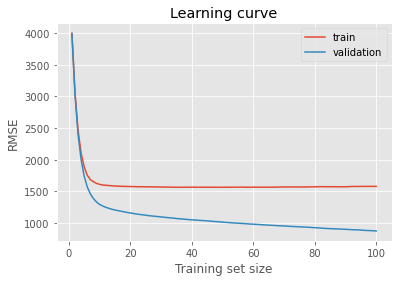

In [ ]:
train_errors = []
val_errors = []

# Loop over the sizes of the training set
for i in range(1,101):
    # Concatenate the models' evaluation results from the first i folds
    train_evals = [models[j].evals_result()['validation_0']['rmse'][:i] for j in range(len(models))]
    val_evals = [models[j].evals_result()['validation_1']['rmse'][:i] for j in range(len(models))]
    
    # Compute the mean and standard deviation of the evaluation results at each training set size
    train_mean = np.mean(train_evals, axis=0)
    train_std = np.std(train_evals, axis=0)
    val_mean = np.mean(val_evals, axis=0)
    val_std = np.std(val_evals, axis=0)
    
    # Append the mean errors to the lists
    train_errors.append(train_mean[-1])
    val_errors.append(val_mean[-1])
    
# Plot the learning curve
plt.plot(range(1, 101), train_errors, label='train')
plt.plot(range(1, 101), val_errors, label='validation')
plt.xlabel('Training set size')
plt.ylabel('RMSE')
plt.title('Learning curve')
plt.legend()
plt.show()





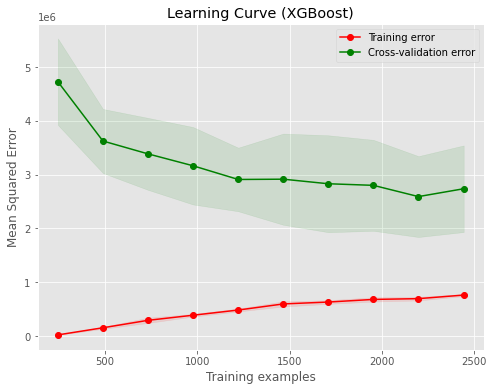

In [ ]:
from sklearn.model_selection import learning_curve
train_sizes = np.linspace(0.1, 1.0, 10)
train_sizes, train_scores, valid_scores = learning_curve(
    model, X, y, train_sizes=train_sizes, cv=10, scoring="neg_mean_squared_error", n_jobs=-1)

# Calculate the mean and standard deviation of the training and validation scores
train_mean = -np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
valid_mean = -np.mean(valid_scores, axis=1)
valid_std = np.std(valid_scores, axis=1)

plt.figure(figsize=(8, 6))
plt.fill_between(train_sizes, train_mean - train_std,
                 train_mean + train_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, valid_mean - valid_std,
                 valid_mean + valid_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_mean, 'o-', color="r",
         label="Training error")
plt.plot(train_sizes, valid_mean, 'o-', color="g",
         label="Cross-validation error")
plt.xlabel("Training examples")
plt.ylabel("Mean Squared Error")
plt.legend(loc="best")
plt.title("Learning Curve (XGBoost)")
plt.show()

In [ ]:
user_id = test["ID"]

model_preds = [model.predict(app_test_encode) for model in models]
model_preds

[array([2678.2932, 3324.8564, 7554.463 , ..., 4114.513 , 3750.1475,
        4778.654 ], dtype=float32),
 array([2718.8513, 2921.1208, 8243.914 , ..., 4400.9478, 3259.5571,
        4690.5854], dtype=float32),
 array([2576.7397, 3352.3645, 7642.4023, ..., 3591.344 , 3787.337 ,
        4706.4604], dtype=float32),
 array([2697.3445, 3191.259 , 8171.2715, ..., 3712.1997, 3190.315 ,
        5796.748 ], dtype=float32),
 array([2496.6108, 3423.7021, 8056.803 , ..., 3613.4924, 3770.2354,
        4921.0493], dtype=float32),
 array([2613.4768, 3328.9893, 7343.8867, ..., 4094.5596, 3052.7625,
        4750.7393], dtype=float32),
 array([2556.3008, 3323.5095, 8309.201 , ..., 3657.6284, 3546.865 ,
        4884.3726], dtype=float32),
 array([2581.7456, 3302.1687, 7756.2246, ..., 4617.6265, 3678.857 ,
        4951.5967], dtype=float32),
 array([2547.5498, 3294.0857, 8062.0464, ..., 3764.9324, 3527.4111,
        4816.4746], dtype=float32),
 array([2597.4739, 3015.313 , 7633.0483, ..., 2932.7227, 3487.19

In [ ]:
sample_submission = pd.DataFrame()
sample_submission['ID'] = user_id
sample_submission['ElapsedTime(second)'] = np.round(np.mean(model_preds,axis=0)).astype(int)

In [ ]:
sample_submission.head()

,ID,ElapsedTime(second)
0,1669,2582
1,2091,3265
2,585,7893
3,1455,7824
4,1801,2302


In [ ]:
sample_submission.head()

,ID,ElapsedTime(second)
0,1669,2606
1,2091,3248
2,585,7877
3,1455,7830
4,1801,2275


In [ ]:
sample_submission.shape

(1211, 2)

In [ ]:
sample_submission.to_csv("sample_submission.csv", index = False)

### Private LB best rmse: 1273.2294 - 1st place